# Define MHWs using [Hobday definition](https://doi.org/10.1016/j.pocean.2015.12.014)
# SPEAR-HI
(>=5 consecutive days w/ a gap of >=3 days in between events for each grid cell)

|  | OISST | ERA5 | SPEAR-LO | SPEAR-HI |
| :---------- | :---------- | :----------: | ----------: | ----------: |
| Temperature | SST | SST | SST | SST |
| Sampling<br>frequency | Daily | Daily | Daily | Daily |
| Lat/Lon<br>resolution | 0.25˚ x 0.25˚ | 0.25˚ x 0.25˚ | 1˚ x 1˚ | 0.25˚ x 0.25˚ |
|Time period | 1981-09 : 2025-09 | 1983-01 : 2021-06 | 1981-09 : 2010-12 | 1991-01 : 2100-01 |

In [1]:
import xarray as xr
import pandas as pd
import json
import numpy as np
import cmocean
import cartopy.crs as ccrs #cartopy coord ref sys
import cartopy
import cartopy.feature as cfeature
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER
import matplotlib.pyplot as plt
import matplotlib.colors as colors
from matplotlib.colors import LogNorm
import matplotlib.colors as mcolors
from matplotlib.colors import TwoSlopeNorm
import time
from tqdm import tqdm
import glob
import os
from collections import defaultdict
import xesmf as xe

1. Check slurm files for missing data (dmget/gcp individually)
2. Then once you get all the missing data, run the first batch_scrip (03_submit_batch_ncks_ncrcat_spear)

In [2]:
formatted_list = [str(i).zfill(2) for i in range(26,31)]
ens_lds2630 = [] #list of the ds'
for ens_num in tqdm(formatted_list):
    ens_lds2630.append(xr.open_mfdataset(f'/work5/stb/MHW-gfdl/SPEAR/SPEAR_c384_OM4p25_Hist_SSP245_IC1991_R61_ens_{ens_num}/SST*.nc',
                                     decode_timedelta=True).rename_vars({'SST': f'SST_ens{ens_num}'}))
    time.sleep(0.01)

100%|██████████| 5/5 [09:25<00:00, 113.18s/it]


In [4]:
len(ens_lds2630)

5

In [5]:
ens_lds2630

[<xarray.Dataset> Size: 7GB
 Dimensions:     (time: 40178, yT: 131, xT: 349, nv: 2, xTe: 1441, yTe: 1081)
 Coordinates:
   * time        (time) object 321kB 1991-01-01 12:00:00 ... 2100-12-31 12:00:00
   * yT          (yT) float64 1kB 0.0 0.25 0.5 0.75 ... 30.24 30.46 30.67 30.89
   * xT          (xT) float64 3kB -97.84 -97.58 -97.33 ... -10.67 -10.42 -10.17
   * nv          (nv) float64 16B 1.0 2.0
   * xTe         (xTe) float64 12kB -299.8 -299.6 -299.3 ... 59.66 59.91 60.16
   * yTe         (yTe) float64 9kB -80.43 -80.35 -80.27 ... 89.78 89.89 90.0
 Data variables:
     SST_ens26   (time, yT, xT) float32 7GB dask.array<chunksize=(40178, 131, 349), meta=np.ndarray>
     average_DT  (time) timedelta64[ns] 321kB dask.array<chunksize=(40178,), meta=np.ndarray>
     average_T1  (time) datetime64[ns] 321kB dask.array<chunksize=(40178,), meta=np.ndarray>
     average_T2  (time) datetime64[ns] 321kB dask.array<chunksize=(40178,), meta=np.ndarray>
     time_bnds   (time, nv) object 643kB da

In [3]:
%%time 
#ONLY OPEN UP TIL ENS 25 SINCE 26-30 ARE ALREADY CONCATONATED INTO A SINGLE NC FILE FOR EACH ENS
#Open all the ensemble members as a list of datasets to run mhw detection function over them as a loop
#zfill pads single ints w 0's to the left
formatted_list = [str(i).zfill(2) for i in range(1, 26)]
ens_lds = [] #list of the ds'
for ens_num in tqdm(formatted_list):
    ens_lds.append(xr.open_mfdataset(f'/work5/stb/MHW-gfdl/SPEAR/SPEAR_c384_OM4p25_Hist_SSP245_IC1991_R61_ens_{ens_num}/SST*.nc',
                                     decode_timedelta=True).rename_vars({'SST': f'SST_ens{ens_num}'}))
    time.sleep(0.01)

100%|██████████| 25/25 [1:07:21<00:00, 161.68s/it]

CPU times: user 41.8 s, sys: 1min 43s, total: 2min 25s
Wall time: 1h 7min 21s


In [6]:
len(ens_lds)

25

In [7]:
ens_lds

[<xarray.Dataset> Size: 7GB
 Dimensions:     (time: 40178, yT: 131, xT: 349, nv: 2, xTe: 1441, yTe: 1081)
 Coordinates:
   * time        (time) object 321kB 1991-01-01 12:00:00 ... 2100-12-31 12:00:00
   * yT          (yT) float64 1kB 0.0 0.25 0.5 0.75 ... 30.24 30.46 30.67 30.89
   * xT          (xT) float64 3kB -97.84 -97.58 -97.33 ... -10.67 -10.42 -10.17
   * nv          (nv) float64 16B 1.0 2.0
   * xTe         (xTe) float64 12kB -299.8 -299.6 -299.3 ... 59.66 59.91 60.16
   * yTe         (yTe) float64 9kB -80.43 -80.35 -80.27 ... 89.78 89.89 90.0
 Data variables:
     SST_ens01   (time, yT, xT) float32 7GB dask.array<chunksize=(365, 131, 349), meta=np.ndarray>
     average_DT  (time) timedelta64[ns] 321kB dask.array<chunksize=(365,), meta=np.ndarray>
     average_T1  (time) datetime64[ns] 321kB dask.array<chunksize=(365,), meta=np.ndarray>
     average_T2  (time) datetime64[ns] 321kB dask.array<chunksize=(365,), meta=np.ndarray>
     time_bnds   (time, nv) object 643kB dask.array

In [8]:
ens_lds_all = ens_lds + ens_lds2630

In [38]:
ens_lds_all

[<xarray.Dataset> Size: 7GB
 Dimensions:     (time: 40178, yT: 131, xT: 349, nv: 2, xTe: 1441, yTe: 1081)
 Coordinates:
   * time        (time) object 321kB 1991-01-01 12:00:00 ... 2100-12-31 12:00:00
   * yT          (yT) float64 1kB 0.0 0.25 0.5 0.75 ... 30.24 30.46 30.67 30.89
   * xT          (xT) float64 3kB -97.84 -97.58 -97.33 ... -10.67 -10.42 -10.17
   * nv          (nv) float64 16B 1.0 2.0
   * xTe         (xTe) float64 12kB -299.8 -299.6 -299.3 ... 59.66 59.91 60.16
   * yTe         (yTe) float64 9kB -80.43 -80.35 -80.27 ... 89.78 89.89 90.0
 Data variables:
     SST_ens01   (time, yT, xT) float32 7GB dask.array<chunksize=(365, 131, 349), meta=np.ndarray>
     average_DT  (time) timedelta64[ns] 321kB dask.array<chunksize=(365,), meta=np.ndarray>
     average_T1  (time) datetime64[ns] 321kB dask.array<chunksize=(365,), meta=np.ndarray>
     average_T2  (time) datetime64[ns] 321kB dask.array<chunksize=(365,), meta=np.ndarray>
     time_bnds   (time, nv) object 643kB dask.array

In [39]:
len(ens_lds_all)

30

In [43]:
carib = dict(yT=slice(10, 31.5), xT=slice(None,-16))
formatted_list = [str(i).zfill(2) for i in range(1,31)]
ens_lda_carib = [ens_lds_all[i][f'SST_ens{ens_num}'].sel(**carib) for (i, ens_num) in zip(np.arange(0, len(ens_lds_all)), 
                                                                                          formatted_list)]

In [44]:
len(ens_lda_carib)

30

In [45]:
ens_lda_carib[0].coords

Coordinates:
  * time     (time) object 321kB 1991-01-01 12:00:00 ... 2100-12-31 12:00:00
  * yT       (yT) float64 720B 10.2 10.44 10.69 10.93 ... 30.46 30.67 30.89
  * xT       (xT) float64 3kB -97.84 -97.58 -97.33 ... -16.65 -16.4 -16.15

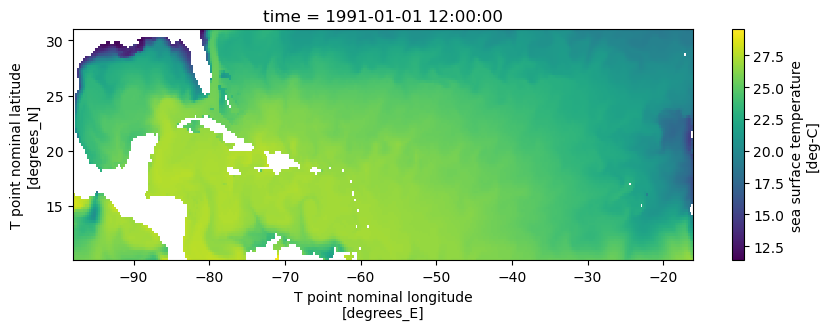

In [46]:
ens_lda_carib[0][0].plot(figsize=(10,3))

## Plotting funcs

In [2]:
def cartopy_plot(da, cmap_choice, var_title=None, norm=None, ax=None):
    if ax is None:
        raise ValueError("This function now requires an axis when used for panels")

    ax.set_extent([-98, -60, 17.5, 31], crs=ccrs.PlateCarree())
    ax.add_feature(cfeature.NaturalEarthFeature('physical', 'land', '50m', edgecolor='face', facecolor='0.5'))

    # ---- model agnostic: infer coord names ----
    lat_name = next(c for c in ['lat','latitude','yT','yh'] if c in da.coords)
    lon_name = next(c for c in ['lon','longitude','xT','xh'] if c in da.coords)
    
    if lat_name is None or lon_name is None:
        raise ValueError(f"Could not infer lat/lon coordinates. " f"Found coords: {list(da.coords)}")
    # --------------------------------------------
    im = ax.pcolormesh(da[lon_name], da[lat_name], da, transform=ccrs.PlateCarree(), 
                       cmap=cmap_choice, norm=norm)

    ax.set_title(var_title, fontsize=10)
    gl = ax.gridlines(draw_labels=True, linewidth=0.3)
    gl.xlabels_top = False
    gl.ylabels_right = False

    return im # return the image for optional colorbar handling

In [3]:
def cartopy_plot_single(da, cmap_choice, cbar_label, var_title, vmin=None, vmax=None, norm=None, quiver=True):
    proj = ccrs.Mercator() #with Mercator you can put lat lon values.
    fig, ax = plt.subplots(figsize=(8, 8), subplot_kw=dict(projection=proj))
    ax.set_extent([-98, -60, 17.5, 31], crs=ccrs.PlateCarree())
    ax.add_feature(cfeature.NaturalEarthFeature('physical', 'land', '50m',
                                            edgecolor='face',
                                            facecolor='0.5'))
    # ---- infer coord names if not provided ----
    lat_candidates = ['lat', 'latitude', 'yT', 'yh']
    lon_candidates = ['lon', 'longitude', 'xT', 'xh']

    lat_name = next((c for c in lat_candidates if c in da.coords), None)
    lon_name = next((c for c in lon_candidates if c in da.coords), None)

    if lat_name is None or lon_name is None:
        raise ValueError(
            f"Could not infer lat/lon coordinates. "
            f"Found coords: {list(da.coords)}"
        )

    lats = da[lat_name]
    lons = da[lon_name]

    # ---- normalization logic ----
    if norm is None:
        # simple linear scaling
        norm = colors.Normalize(vmin=vmin, vmax=vmax)
    else:
        # override norm limits if vmin/vmax are supplied
        if vmin is not None:
            norm.vmin = vmin
        if vmax is not None:
            norm.vmax = vmax
    # -------------------------------------------------------------------------------
    im = ax.pcolormesh(lons, lats, da, transform=ccrs.PlateCarree(), 
                       norm=norm, cmap=cmap_choice)
    cb = fig.colorbar(im, ax=ax, shrink=0.25, pad=0.1)
    cb.set_label(fr"{cbar_label}", labelpad=8, fontsize=12)
    g1 = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True)
    g1.xlabels_top = False
    g1.ylabels_right = False
    plt.title(f'{var_title}', fontsize=14, y=1.09)

## Detrend

In [36]:
def detrend_func(da):
    #Fits a polynomial to the data along the time dim
    #solves for the polynomial coefficients (slope + intercept) at each (lat, lon) point.
    p = da.polyfit(dim='time', deg=1) #('degree', 'lat', 'lon')
    #evaluates that polynomial at da.time
    fit = xr.polyval(da.time, p.polyfit_coefficients) #('time', 'lat','lon')
    #detrended da along time dim 
    detrended_intime = da - fit
    #w mean added back in to get intuitive values in ˚C
    detrended_wmean = da - fit + da.mean(dim='time')
    # compute local variability
    std = detrended_intime.std(dim='time')
    # standardized anomalies
    #Shows where anomalies are most extreme relative to local variability
    detrended_std = detrended_intime / std

    return fit, detrended_intime

In [47]:
fit_spear_hi = []
detrended_intime_spear_hi = []

for da in tqdm(ens_lda_carib):
    seasonal_cycle = da.groupby('time.month').mean('time')
    da_anom = da.groupby('time.month') - seasonal_cycle
    fit_sh, detrended_sh = detrend_func(da_anom)
    fit_spear_hi.append(fit_sh)
    detrended_intime_spear_hi.append(detrended_sh)
    time.sleep(0.01)

100%|██████████| 30/30 [00:29<00:00,  1.02it/s]


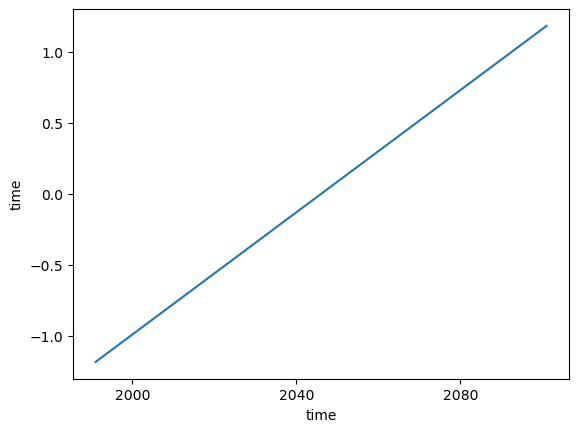

In [48]:
fit_spear_hi[0].mean(['yT','xT']).plot(label='SPEAR-HI ens01-anom fit')

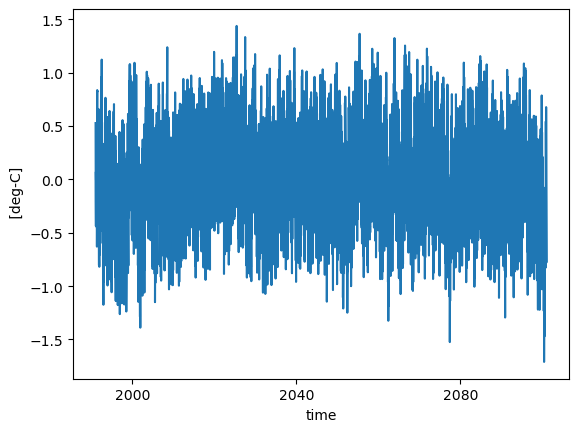

In [49]:
detrended_intime_spear_hi[0].mean(['yT','xT']).plot(label='detrended-anom')
#fit.mean(['lat','lon']).plot(label='fit')

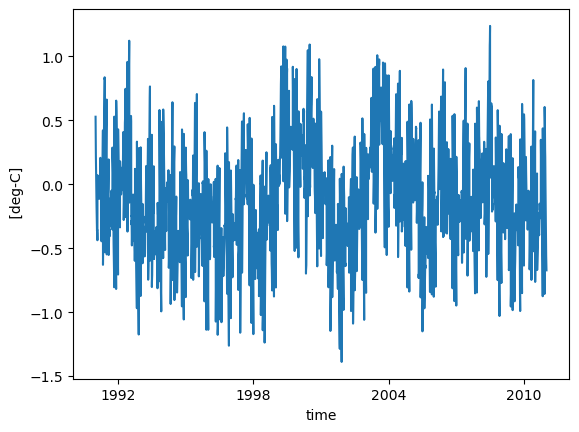

In [50]:
detrended_intime_spear_hi[0].sel(time=slice('1981-09-01', '2010-12-31')).mean(['yT','xT']).plot(label='detrended-anom')
#fit.mean(['lat','lon']).plot(label='fit')

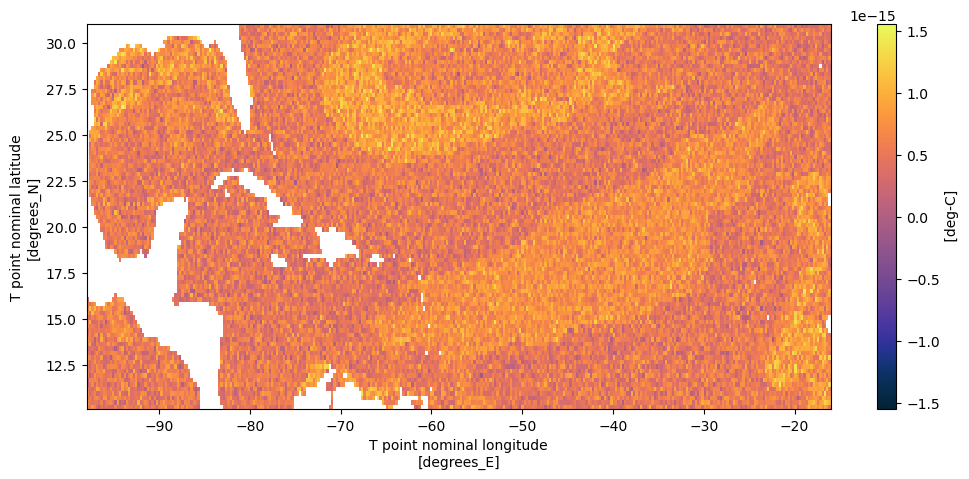

In [51]:
detrended_intime_spear_hi[0].mean('time').plot(figsize=(12,5), cmap=cmocean.cm.thermal)

In [53]:
len(detrended_intime_spear_hi)

30

In [54]:
formatted_list = [str(i).zfill(2) for i in range(1, 31)]
for (da,i) in zip(detrended_intime_spear_hi,formatted_list):
    da.to_netcdf(f'/work5/stb/MHW-gfdl/SPEAR/vars/SPEAR-HI/detrended/detrended_anom_intime_spear_hi{i}.nc')

## 90$^{th}$ Percentile, Duration count

In [22]:
def compute_daily_percentile_exceedance(da, time_dim='time', spatial_dims=('lat', 'lon'), #('xh', 'yh') 
                                        percentile=0.9):
    """
    Compute daily climatological percentile exceedance.

    Parameters
    ----------
    da : xr.DataArray
        Input data (e.g. detrended SST)
    time_dim : str
        Name of time dimension
    spatial_dims : tuple of str
        Spatial dimensions (e.g. ('lat','lon'))
    percentile : float
        Percentile threshold (e.g. 0.9)

    Returns
    -------
    exceedance_masked : xr.DataArray
    exceedance_bool : xr.DataArray (bool)
    exceedance_int  : xr.DataArray (int)
    threshold       : xr.DataArray
    """

    # Group by day of the year and then calculate the 90th percentile for each day
    grouped = da.groupby(f'{time_dim}.dayofyear')

    # Percentile climatology
    clim_p = grouped.quantile(percentile, dim=time_dim)

    # Align climatology with full time series
    #AKA reindex and repeat the clim_p array to match the full dataset's dayofyear
    dayofyear = da[time_dim].dt.dayofyear
    threshold = clim_p.sel(dayofyear=dayofyear)

    # Exceedance masks:
    #Identify temp/days where current temperature exceeds the 90th percentile baseline
    exceedance_masked = da.where(da > threshold)
    #Make boolean mask of days that exceed 90th percentile
    exceedance_bool = da > threshold
    #Make boolean mask to int to count days for 5-day dur/3-day gap threshold
    exceedance_int = exceedance_bool.astype(int)

    return exceedance_masked, exceedance_bool, exceedance_int, threshold

In [23]:
#First func is used in 2nd func
def find_events(arr, min_run=5, min_sep=3):
    events = []
    current_run_start = None

    for i, val in enumerate(arr):
        if val == 1:
            if current_run_start is None:
                current_run_start = i
        else:
            if current_run_start is not None:
                run_length = i - current_run_start

                if run_length >= min_run:
                    if events:
                        prev_start, prev_end = events[-1]
                        if current_run_start - prev_end >= min_sep:
                            events.append((current_run_start, i - 1))
                        else:
                            events[-1] = (prev_start, i - 1)
                    else:
                        events.append((current_run_start, i - 1))

                current_run_start = None

    # Handle run ending at final timestep
    if current_run_start is not None:
        run_length = len(arr) - current_run_start
        if run_length >= min_run:
            if events:
                prev_start, prev_end = events[-1]
                if current_run_start - prev_end >= min_sep:
                    events.append((current_run_start, len(arr) - 1))
                else:
                    events[-1] = (prev_start, len(arr) - 1)
            else:
                events.append((current_run_start, len(arr) - 1))

    return events

def detect_events_xarray(exceedance_int, time_dim="time", spatial_dims=("lat", "lon"), 
                         min_run=5, min_sep=3):
    """
    Apply event detection to each grid cell of an exceedance array.

    Parameters
    ----------
    exceedance_int : xr.DataArray
        Integer exceedance mask (0/1)
    time_dim : str
        Time dimension name
    spatial_dims : tuple of str
        Spatial dimensions
    min_run : int
        Minimum duration (days)
    min_sep : int
        Minimum separation (days)

    Returns
    -------
    events_by_cell : dict
        {(coord_tuple): [(start_idx, end_idx), ...]}
    event_mask : xr.DataArray (bool)
    """

    # Stack spatial dimensions
    stacked = exceedance_int.stack(grid_cell=spatial_dims)

    events_by_cell = {}

    for cell in stacked.grid_cell.values:
        ts = stacked.sel(grid_cell=cell).values
        events = find_events(ts, min_run=min_run, min_sep=min_sep)

        if events:
            events_by_cell[cell] = events

    # Build boolean mask
    event_mask = xr.zeros_like(exceedance_int, dtype=bool)
    time_vals = exceedance_int[time_dim]

    for cell, events in events_by_cell.items():
        cell_dict = dict(zip(spatial_dims, cell))

        for start, end in events:
            event_mask.loc[
                {
                    **cell_dict,
                    time_dim: time_vals[start:end+1]
                }
            ] = True

    return events_by_cell, event_mask

In [24]:
%%time
# Step 1: exceedance
ex_masked_splo = [] 
ex_bool_splo = [] 
ex_int_splo = [] 
threshold_splo = []
for da in tqdm(detrended_intime_spear_hi):
    ex_masked_sl, ex_bool_sl, ex_int_sl, threshold_sl = compute_daily_percentile_exceedance(da, time_dim='time',
                                                                                        spatial_dims=('yT', 'xT'),
                                                                                            percentile=0.9)
    ex_masked_splo.append(ex_masked_sl) 
    ex_bool_splo.append(ex_bool_sl) 
    ex_int_splo.append(ex_int_sl) 
    threshold_splo.append(threshold_sl)

100%|██████████| 30/30 [01:11<00:00,  2.38s/it]

CPU times: user 55.2 s, sys: 15.9 s, total: 1min 11s
Wall time: 1min 11s


In [26]:
formatted_list = [str(i).zfill(2) for i in range(1, 31)]
for (da,i) in zip(ex_masked_splo,formatted_list):
    da.to_netcdf(f'/work5/stb/MHW-gfdl/SPEAR/vars/SPEAR-LO/exceedance/ex_masked_splo{i}.nc', mode='w')

In [27]:
formatted_list = [str(i).zfill(2) for i in range(1, 31)]
for (da,i) in zip(ex_bool_splo,formatted_list):
    da.to_netcdf(f'/work5/stb/MHW-gfdl/SPEAR/vars/SPEAR-LO/exceedance/ex_bool_splo{i}.nc', mode='w')

In [28]:
formatted_list = [str(i).zfill(2) for i in range(1, 31)]
for (da,i) in zip(ex_int_splo,formatted_list):
    da.to_netcdf(f'/work5/stb/MHW-gfdl/SPEAR/vars/SPEAR-LO/exceedance/ex_int_splo{i}.nc', mode='w')

In [29]:
formatted_list = [str(i).zfill(2) for i in range(1, 31)]
for (da,i) in zip(threshold_splo,formatted_list):
    da.to_netcdf(f'/work5/stb/MHW-gfdl/SPEAR/vars/SPEAR-LO/exceedance/threshold_splo{i}.nc', mode='w')

In [30]:
%%time
# Step 2: event detection
events_by_cell_splo = [] 
event_mask_splo = [] 

for da in tqdm(ex_int_splo):
    events_by_cell_sl, event_mask_sl = detect_events_xarray(da, time_dim='time', 
                                                            spatial_dims=('yT', 'xT'), min_run=5, min_sep=3)
    events_by_cell_splo.append(events_by_cell_sl)
    event_mask_splo.append(event_mask_sl)

100%|██████████| 30/30 [1:06:21<00:00, 132.73s/it]

CPU times: user 1h 6min 5s, sys: 2 s, total: 1h 6min 7s
Wall time: 1h 6min 21s


In [31]:
formatted_list = [str(i).zfill(2) for i in range(1, 31)]
for (da,i) in zip(event_mask_splo,formatted_list):
    da.to_netcdf(f'/work5/stb/MHW-gfdl/SPEAR/vars/SPEAR-LO/events/event_mask_splo{i}.nc')

In [32]:
# 1. Convert tuple keys to strings for every dictionary in the list
stringified_list = [{str(k): v for k, v in d.items()} 
                    for d in events_by_cell_splo]

# 2. Save the processed list to a JSON file
file_path = "/work5/stb/MHW-gfdl/SPEAR/vars/SPEAR-LO/events/events_by_cell_splo.json"
with open(file_path, "w") as f:
    json.dump(stringified_list, f, indent=4)


In [138]:
import json

with open('/work5/stb/MHW-gfdl/SPEAR/vars/SPEAR-LO/events/events_by_cell_splo.json', 'r') as json_file:
    loaded_dict = json.load(json_file)

In [ ]:
events_by_cell_splo == events_by_c

In [141]:
loaded_dict == stringified_list

False

In [82]:
events_by_cell_oi

{(10.125, 262.125): [(24, 28),
  (169, 173),
  (204, 214),
  (225, 229),
  (246, 251),
  (261, 267),
  (348, 354),
  (460, 464),
  (481, 485),
  (505, 509),
  (553, 557),
  (622, 627),
  (630, 634),
  (655, 659),
  (677, 694),
  (713, 726),
  (1150, 1154),
  (1158, 1162),
  (1504, 1508),
  (2030, 2035),
  (2119, 2125),
  (2129, 2139),
  (2204, 2214),
  (2273, 2310),
  (2315, 2322),
  (2383, 2388),
  (2430, 2436),
  (2633, 2638),
  (3291, 3299),
  (3554, 3574),
  (3641, 3649),
  (3666, 3672),
  (3867, 3871),
  (4066, 4071),
  (4147, 4151),
  (4181, 4187),
  (4190, 4196),
  (4272, 4277),
  (4296, 4302),
  (4310, 4316),
  (4732, 4736),
  (4818, 4828),
  (5181, 5185),
  (5917, 5921),
  (5928, 5946),
  (5950, 5962),
  (5970, 6029),
  (6042, 6046),
  (6116, 6133),
  (7122, 7129),
  (7268, 7276),
  (7604, 7610),
  (7647, 7652),
  (7709, 7729),
  (8366, 8370),
  (8598, 8602),
  (10178, 10182),
  (10195, 10199),
  (10221, 10243),
  (10253, 10272)],
 (10.125, 262.375): [(24, 28),
  (168, 173),
 

___________________________________

___________________________________

___________________________________

In [4]:
#FOR VEE'S PROJECT
base_dir = '/work5/stb/MHW-gfdl/SPEAR/SPEAR_monthly_SST'
#nco_fnc_str = 'ncks -O -d xT,-98.0,-10.0 -d yT,0.0,31.0'
#nco_fnc_str = 'ncks -O -d lon,262.0,350.0 -d lat,0.0,31.0'
batch_script = f'{base_dir}/03_submit_batch_VEE'
#batch_script = f'{base_dir}/03_check_for_fils'

var_dict = {'ocean':{'var_list':['SST'], 
                     'ncks_str':'ncks -O -d xT,-100.0,0.0 -d yT,-10.0,75.0'},
           'atmos':{'var_list':['lwflx', 'hfds', 'u_ref', 'v_ref', 't_surf'],
                     'ncks_str':'ncks -O -d lon,262.0,350.0 -d lat,0.0,31.0'}}
yr0 = 1991
yrn = 2100
outdir = base_dir

nfil = 0
for ens_m in range(30):
    ens_str = str(ens_m+1).zfill(2) # ensemble string - zero padded
    indir = f'{base_dir}/SPEAR_c384_OM4p25_Hist_SSP245_IC1991_R61_ens_{ens_str}'

    #for var_type in var_dict:
    for var_type in ['ocean']:
        # creating a single string with all the variables for bash to work with
        bash_list = ''
        for var_nm in var_dict[var_type]['var_list']:
            bash_list = f'{bash_list} {var_nm}'

        # bringing together the sbatch command
        sbatch_fnc_str = f'sbatch --partition=batch {batch_script} {indir} {ens_str} {yr0} {yrn} "{bash_list}"'
        sbatch_fnc_str = f"{sbatch_fnc_str} '{var_dict[var_type]['ncks_str']}' {indir}"
 
        nfil+=1
        #print(ncfile)
        #outfile = f'{indir}/{var_nm}_ens{ens_str}_{ens_yr}.nc'
        os.system(sbatch_fnc_str)

print(nfil)

Submitted batch job 52642026
Submitted batch job 52642027
Submitted batch job 52642028
Submitted batch job 52642029
Submitted batch job 52642030
Submitted batch job 52642031
Submitted batch job 52642032
Submitted batch job 52642033
Submitted batch job 52642034
Submitted batch job 52642035
Submitted batch job 52642036
Submitted batch job 52642037
Submitted batch job 52642038
Submitted batch job 52642039
Submitted batch job 52642040
Submitted batch job 52642041
Submitted batch job 52642042
Submitted batch job 52642043
Submitted batch job 52642044
Submitted batch job 52642045
Submitted batch job 52642046
Submitted batch job 52642047
Submitted batch job 52642048
Submitted batch job 52642049
Submitted batch job 52642050
Submitted batch job 52642051
Submitted batch job 52642052
Submitted batch job 52642053
Submitted batch job 52642054
Submitted batch job 52642055
30


In [10]:
#!os.system('unset SBATCH_PARTITION')
base_dir = '/work5/stb/MHW-gfdl/SPEAR'
#nco_fnc_str = 'ncks -O -d xT,-98.0,-10.0 -d yT,0.0,31.0'
#nco_fnc_str = 'ncks -O -d lon,262.0,350.0 -d lat,0.0,31.0'
batch_script = f'{base_dir}/03_submit_batch_ncks_ncrcat_spear'
#batch_script = f'{base_dir}/03_check_for_fils'

var_dict = {'ocean':{'var_list':['SST'], 
                     'ncks_str':'ncks -O -d xT,-98.0,-10.0 -d yT,0.0,31.0'},
            'atmos':{'var_list':['lwflx', 'hfds', 'u_ref', 'v_ref', 't_surf'],
                     'ncks_str':'ncks -O -d lon,262.0,350.0 -d lat,0.0,31.0'}}
yr0 = 1991
yrn = 2100
outdir = base_dir

nfil = 0
for ens_m in range(25,30):
    ens_str = str(ens_m+1).zfill(2) # ensemble string - zero padded
    indir = f'{base_dir}/SPEAR_c384_OM4p25_Hist_SSP245_IC1991_R61_ens_{ens_str}'

    #for var_type in var_dict:
    for var_type in ['ocean']:
        # creating a single string with all the variables for bash to work with
        bash_list = ''
        for var_nm in var_dict[var_type]['var_list']:
            bash_list = f'{bash_list} {var_nm}'

        # bringing together the sbatch command
        sbatch_fnc_str = f'sbatch --partition=batch {batch_script} {indir} {ens_str} {yr0} {yrn} "{bash_list}"'
        sbatch_fnc_str = f"{sbatch_fnc_str} '{var_dict[var_type]['ncks_str']}' {indir}"
 
        nfil+=1
        #print(ncfile)
        #outfile = f'{indir}/{var_nm}_ens{ens_str}_{ens_yr}.nc'
        os.system(sbatch_fnc_str)

print(nfil)

Submitted batch job 52746011
Submitted batch job 52746012
Submitted batch job 52746013
Submitted batch job 52746014
Submitted batch job 52746015
5


In [9]:
s = xr.open_dataset('/work5/stb/MHW-gfdl/SPEAR/SPEAR_c384_OM4p25_Hist_SSP245_IC1991_R61_ens_01/SST_ens01_1991.nc',
                   decode_timedelta=True)

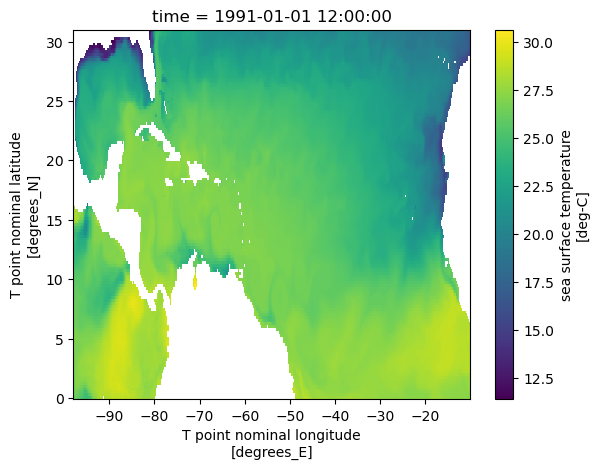

In [11]:
s.SST[0].plot()

In [3]:
#open and subset to caribbean region
ens1 = xr.open_mfdataset('/work5/stb/MHW-gfdl/SPEAR/SPEAR_c384_OM4p25_Hist_SSP245_IC1991_R61_ens_01/*.SST.nc',
                       decode_timedelta=True)

In [2]:
#SPEAR-HI dir
ens1_allvars = xr.open_mfdataset('/work5/stb/MHW-gfdl/SPEAR/SPEAR_c384_OM4p25_Hist_SSP245_IC1991_R61_ens_01/*.*.nc',
                       decode_timedelta=True)

/nbhome/Shanice.Bailey/conda/envs/bai_env/lib/python3.11/site-packages/xarray/conventions.py:204: SerializationWarning: variable 'hfds' has multiple fill values {np.float64(1e+20), np.float32(1e+20)} defined, decoding all values to NaN.
  var = coder.decode(var, name=name)


KeyboardInterrupt: 

In [ ]:
%%time 
#Open all the ensemble members as a list of datasets to run mhw detection function over them as a loop
#zfill pads single ints w 0's to the left
formatted_list = [str(i).zfill(2) for i in range(1, 31)]
ens_lds = [] #list of the ds'
for ens_num in tqdm(formatted_list):
    path = f'/work5/stb/MHW-gfdl/SPEAR/SPEAR_c384_OM4p25_Hist_SSP245_IC1991_R61_ens_{ens_num}/*.SST.nc'
    ens_lds.append(xr.open_mfdataset(path, decode_timedelta=True).rename_vars({'SST': f'SST_ens{ens_num}'}))
    time.sleep(0.01)

  3%|▎         | 1/30 [00:01<00:57,  1.99s/it]

In [15]:
ens1.SST.sel(xT=slice(-98, -10), yT=slice(0,31)).mean(('yT','xT')).plot(figsize=(12,4))
plt.grid();

KeyboardInterrupt: 

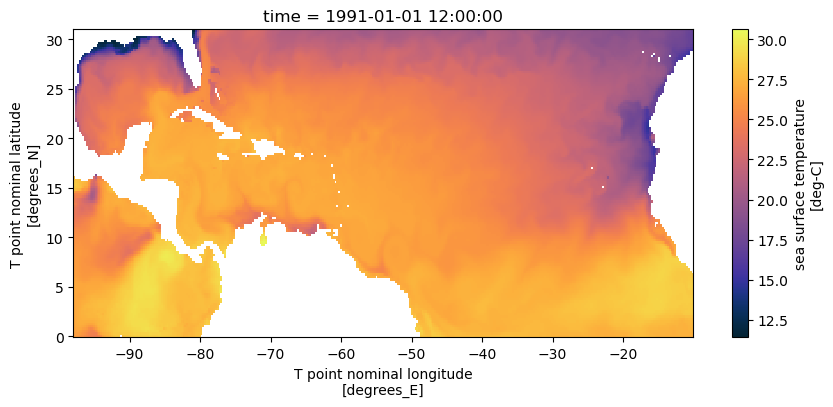

In [11]:
ens1.SST.sel(xT=slice(-98, -10), yT=slice(0,31))[0].plot(figsize=(10,4), cmap=cmocean.cm.thermal)

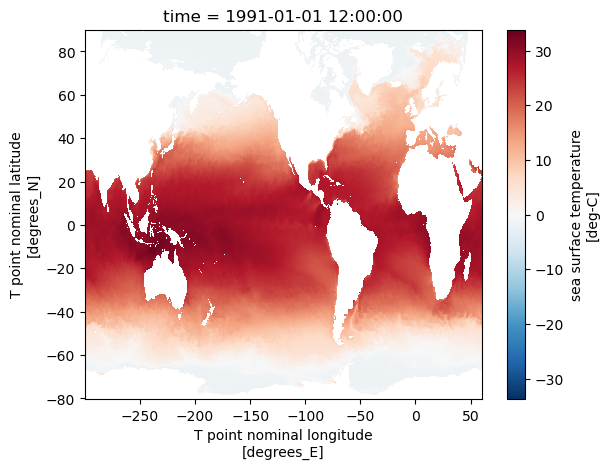

In [6]:
ens1.SST[0].plot()

In [8]:
sst2

<xarray.Dataset> Size: 2GB
Dimensions:     (time: 110, yT: 1080, xT: 1440, nv: 2, xTe: 1441, yTe: 1081)
Coordinates:
  * nv          (nv) float64 16B 1.0 2.0
  * time        (time) object 880B 1991-07-02 12:00:00 ... 2100-07-02 00:00:00
  * xT          (xT) float64 12kB -299.7 -299.5 -299.2 ... 59.53 59.78 60.03
  * xTe         (xTe) float64 12kB -299.8 -299.6 -299.3 ... 59.66 59.91 60.16
  * yT          (yT) float64 9kB -80.39 -80.31 -80.23 ... 89.73 89.84 89.95
  * yTe         (yTe) float64 9kB -80.43 -80.35 -80.27 ... 89.78 89.89 90.0
Data variables:
    GEOLAT      (time, yT, xT) float32 684MB dask.array<chunksize=(10, 1080, 1440), meta=np.ndarray>
    GEOLON      (time, yT, xT) float32 684MB dask.array<chunksize=(10, 1080, 1440), meta=np.ndarray>
    SST         (time, yT, xT) float32 684MB dask.array<chunksize=(10, 1080, 1440), meta=np.ndarray>
    time_bnds   (time, nv) object 2kB dask.array<chunksize=(10, 2), meta=np.ndarray>
    average_T1  (time) datetime64[ns] 880B dask.array<chunksize=(10,), meta=np.ndarray>
    average_T2  (time) datetime64[ns] 880B dask.array<chunksize=(10,), meta=np.ndarray>
    average_DT  (time) timedelta64[ns] 880B dask.array<chunksize=(10,), meta=np.ndarray>
Attributes:
    title:      SPEAR_c384_OM4p25_Hist_SSP245_IC1991_R61_ens_02
    grid_type:  regular
    grid_tile:  N/A
    comment:    FMS time averaging, version 3.0, precision=double

## Plotting funcs

In [2]:
def cartopy_plot(da, cmap_choice, var_title=None, norm=None, ax=None):
    if ax is None:
        raise ValueError("This function now requires an axis when used for panels")

    ax.set_extent([-98, -60, 17.5, 31], crs=ccrs.PlateCarree())
    ax.add_feature(cfeature.NaturalEarthFeature('physical', 'land', '50m', edgecolor='face', facecolor='0.5'))

    # ---- model agnostic: infer coord names ----
    lat_name = next(c for c in ['lat','latitude','yT','yh'] if c in da.coords)
    lon_name = next(c for c in ['lon','longitude','xT','xh'] if c in da.coords)
    
    if lat_name is None or lon_name is None:
        raise ValueError(f"Could not infer lat/lon coordinates. " f"Found coords: {list(da.coords)}")
    # --------------------------------------------
    im = ax.pcolormesh(da[lon_name], da[lat_name], da, transform=ccrs.PlateCarree(), 
                       cmap=cmap_choice, norm=norm)

    ax.set_title(var_title, fontsize=10)
    gl = ax.gridlines(draw_labels=True, linewidth=0.3)
    gl.xlabels_top = False
    gl.ylabels_right = False

    return im # return the image for optional colorbar handling

In [8]:
def cartopy_plot_single(da, cmap_choice, cbar_label, var_title, vmin=None, vmax=None, norm=None, quiver=True):
    proj = ccrs.Mercator() #with Mercator you can put lat lon values.
    fig, ax = plt.subplots(figsize=(8, 8), subplot_kw=dict(projection=proj))
    ax.set_extent([-98, -60, 17.5, 31], crs=ccrs.PlateCarree())
    ax.add_feature(cfeature.NaturalEarthFeature('physical', 'land', '50m',
                                            edgecolor='face',
                                            facecolor='0.5'))
    # ---- infer coord names if not provided ----
    lat_candidates = ['lat', 'latitude', 'yT', 'yh']
    lon_candidates = ['lon', 'longitude', 'xT', 'xh']

    lat_name = next((c for c in lat_candidates if c in da.coords), None)
    lon_name = next((c for c in lon_candidates if c in da.coords), None)

    if lat_name is None or lon_name is None:
        raise ValueError(
            f"Could not infer lat/lon coordinates. "
            f"Found coords: {list(da.coords)}"
        )

    lats = da[lat_name]
    lons = da[lon_name]

    # ---- normalization logic ----
    if norm is None:
        # simple linear scaling
        norm = colors.Normalize(vmin=vmin, vmax=vmax)
    else:
        # override norm limits if vmin/vmax are supplied
        if vmin is not None:
            norm.vmin = vmin
        if vmax is not None:
            norm.vmax = vmax
    # -------------------------------------------------------------------------------
    im = ax.pcolormesh(lons, lats, da, transform=ccrs.PlateCarree(), 
                       norm=norm, cmap=cmap_choice)
    cb = fig.colorbar(im, ax=ax, shrink=0.25, pad=0.1)
    cb.set_label(fr"{cbar_label}", labelpad=8, fontsize=12)
    g1 = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True)
    g1.xlabels_top = False
    g1.ylabels_right = False
    plt.title(f'{var_title}', fontsize=14, y=1.09)

## OISST
Vars needed:
- detrended_intime
- threshold
- events_by_cell
- event_mask
- ex_int_oi

In [32]:
detrended_oi = xr.open_dataarray('/work5/stb/MHW-gfdl/SPEAR/vars/OISST/detrended_intime_oisstt.nc', chunks={})

Text(0.5, 1.0, 'Time avg detrended SST \n OISST')

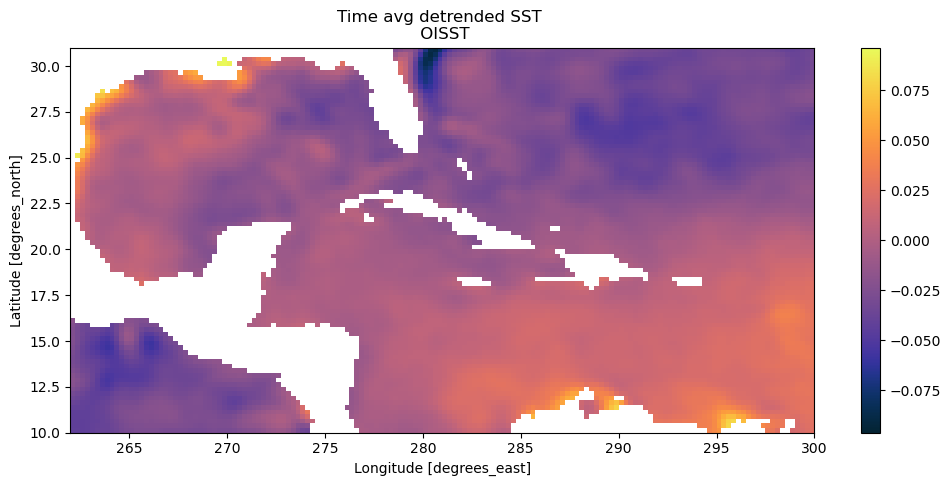

In [39]:
detrended_oi.sel(lon=slice(None, 300)).mean('time').plot(figsize=(12,5), cmap=cmocean.cm.thermal)
plt.title('Time avg detrended SST \n OISST')

In [4]:
event_count_oi = xr.open_dataarray('/work5/stb/MHW-gfdl/SPEAR/vars/OISST/map_vars/event_count_oi.nc', chunks={})
total_mhw_days_oi = xr.open_dataarray('/work5/stb/MHW-gfdl/SPEAR/vars/OISST/map_vars/total_mhw_days_oi.nc', chunks={})
mean_duration_oi = xr.open_dataarray('/work5/stb/MHW-gfdl/SPEAR/vars/OISST/map_vars/mean_duration_oi.nc', chunks={})
median_duration_oi = xr.open_dataarray('/work5/stb/MHW-gfdl/SPEAR/vars/OISST/map_vars/median_duration_oi.nc', chunks={})
max_duration_oi = xr.open_dataarray('/work5/stb/MHW-gfdl/SPEAR/vars/OISST/map_vars/max_duration_oi.nc', chunks={})
mean_mhw_temp_oi = xr.open_dataarray('/work5/stb/MHW-gfdl/SPEAR/vars/OISST/map_vars/mean_mhw_temp_oi.nc', chunks={})
event_freq_oi= xr.open_dataarray('/work5/stb/MHW-gfdl/SPEAR/vars/OISST/map_vars/event_freq_oi.nc', chunks={})
mhw_intensity_oi= xr.open_dataarray('/work5/stb/MHW-gfdl/SPEAR/vars/OISST/map_vars/mhw_intensity_oi.nc', chunks={})

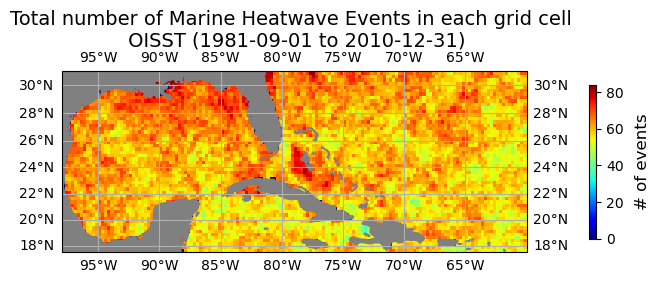

In [21]:
cartopy_plot_single(event_count_oi, 'jet', '# of events', 
             'Total number of Marine Heatwave Events in each grid cell \n OISST (1981-09-01 to 2010-12-31)')

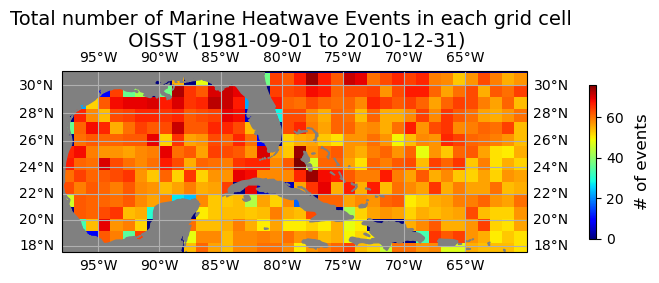

In [51]:
cartopy_plot_single(ev_ct_oi_ng, 'jet', '# of events', 
             'Total number of Marine Heatwave Events in each grid cell \n OISST (1981-09-01 to 2010-12-31)')

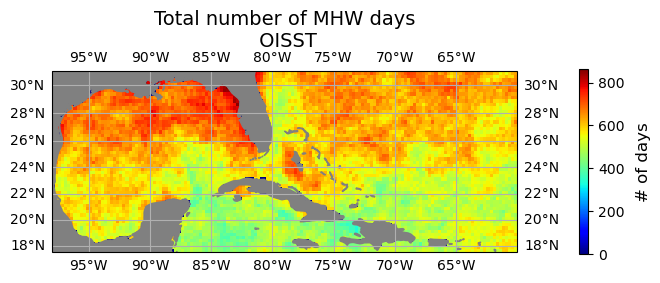

In [17]:
cartopy_plot_single(total_mhw_days_oi, 'jet', '# of days', 
             'Total number of MHW days\n OISST');#if time res is daily


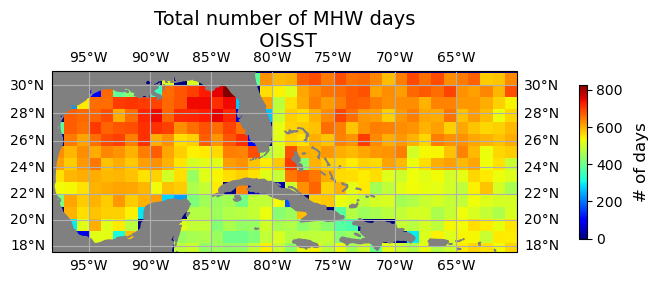

In [52]:
cartopy_plot_single(tot_mhw_days_oi_ng, 'jet', '# of days', 
             'Total number of MHW days\n OISST');#if time res is daily


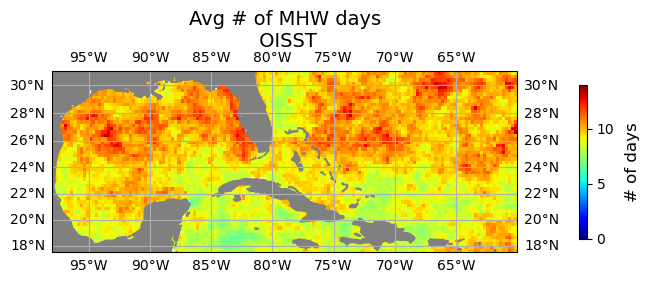

In [22]:
cartopy_plot_single(mean_duration_oi, 'jet', '# of days', 
             'Avg # of MHW days\n OISST',vmin=0, vmax=14,);#if time res is daily


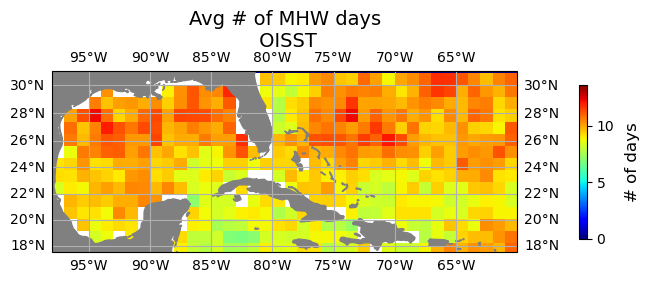

In [53]:
cartopy_plot_single(mean_dur_oi_ng, 'jet', '# of days', 
             'Avg # of MHW days\n OISST')#,vmin=0, vmax=14,);#if time res is daily


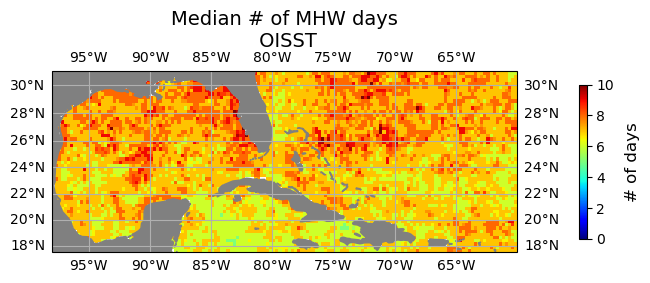

In [23]:
cartopy_plot_single(median_duration_oi, 'jet', '# of days', 
             'Median # of MHW days\n OISST', vmin=0, vmax=10);#if time res is daily


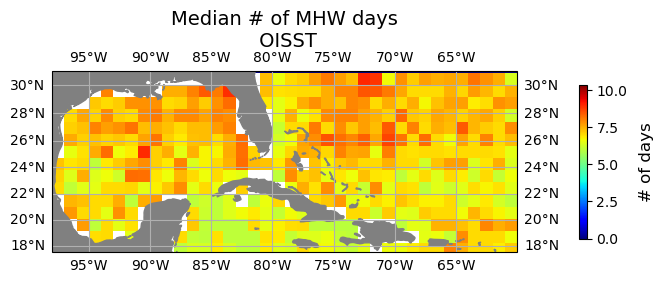

In [54]:
cartopy_plot_single(med_dur_oi_ng, 'jet', '# of days', 
             'Median # of MHW days\n OISST');#if time res is daily


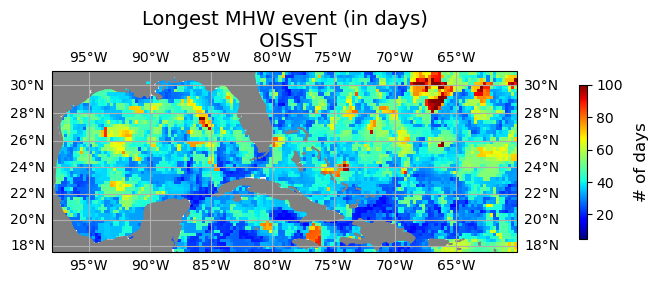

In [10]:
cartopy_plot_single(max_duration_oi, 'jet', '# of days', 
             'Longest MHW event (in days)\n OISST', vmin=5, vmax=100);

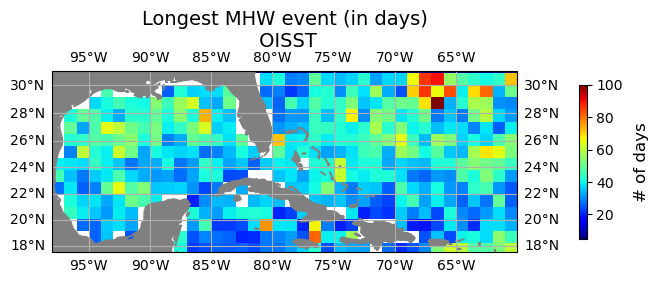

In [31]:
cartopy_plot_single(max_dur_oi_ng, 'jet', '# of days', 
             'Longest MHW event (in days)\n OISST', vmin=5, vmax=100);

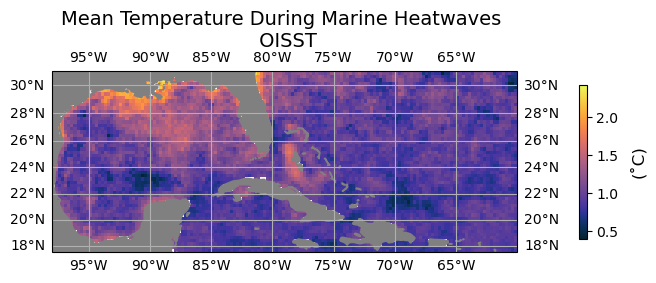

In [25]:
cartopy_plot_single(mean_mhw_temp_oi, cmocean.cm.thermal, '(˚C)', 
             'Mean Temperature During Marine Heatwaves \n OISST',);

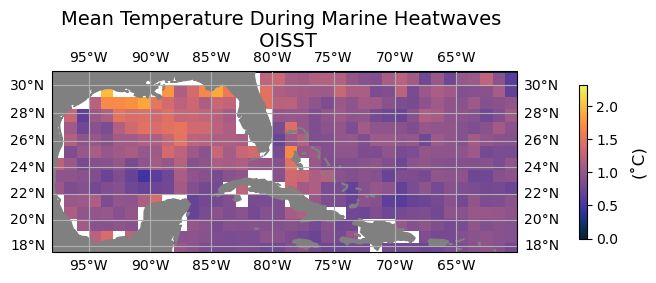

In [56]:
cartopy_plot_single(mean_mhw_tmp_oi_ng, cmocean.cm.thermal, '(˚C)', 
             'Mean Temperature During Marine Heatwaves \n OISST',);

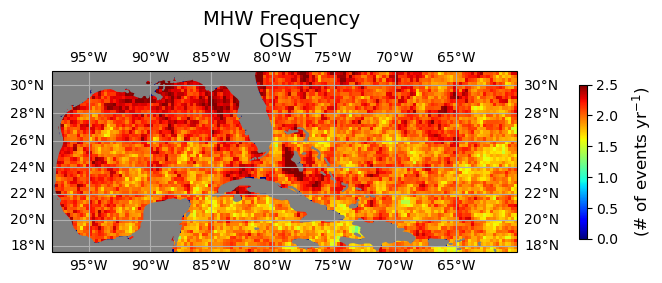

In [26]:
cartopy_plot_single(event_freq_oi, 'jet', r'(# of events yr$^{-1}$)', 'MHW Frequency \n OISST',
                   vmin=0, vmax=2.5);

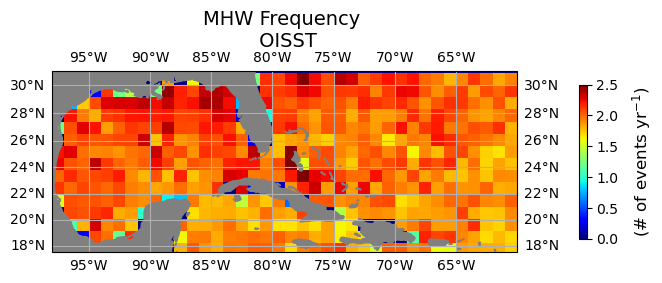

In [57]:
cartopy_plot_single(ev_freq_oi_ng, 'jet', r'(# of events yr$^{-1}$)', 'MHW Frequency \n OISST', 
                   vmin=0, vmax=2.5);

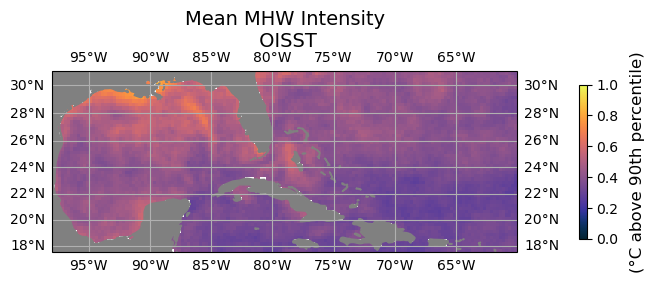

In [30]:
cartopy_plot_single(mhw_intensity_oi, cmocean.cm.thermal, '(°C above 90th percentile)', 
             'Mean MHW Intensity\n OISST', vmin=0, vmax=1); 

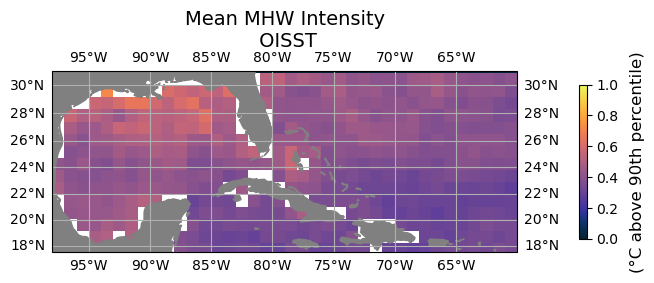

In [58]:
cartopy_plot_single(mhw_int_oi_ng, cmocean.cm.thermal, '(°C above 90th percentile)', 
             'Mean MHW Intensity\n OISST', vmin=0, vmax=1); 

## SPEAR-LO

In [12]:
#detrended SSTs
files = sorted(glob.glob('/work5/stb/MHW-gfdl/SPEAR/vars/SPEAR-LO/detrended/detrended_intime_spear_lo*.nc'))
detrended_splo = []
for f in files:
    ds = xr.open_dataset(f, chunks={})
    da = next(iter(ds.data_vars.values()))
    #take the # in filename and add it to darr name
    ens = os.path.basename(f).split('_lo')[-1].split('.nc')[0] 
    da = da.rename(f'SST_ens{ens}')
    detrended_splo.append(da)

In [13]:
#darr of 1s/0s of SSTs>90th percentile
files = sorted(glob.glob('/work5/stb/MHW-gfdl/SPEAR/vars/SPEAR-LO/exceedance/ex_int_splo*.nc'))
ex_int_splo = []
for f in files:
    ds = xr.open_dataset(f, chunks={})
    da = next(iter(ds.data_vars.values()))
    #take the # in filename and add it to darr name
    ens = os.path.basename(f).split('_lo')[-1].split('.nc')[0] 
    da = da.rename(f'{ens}')
    ex_int_splo.append(da)

In [14]:
#darr of 90th percentile SSTs
files = sorted(glob.glob('/work5/stb/MHW-gfdl/SPEAR/vars/SPEAR-LO/exceedance/threshold_splo*.nc'))
threshold_splo = []
for f in files:
    ds = xr.open_dataset(f, chunks={})
    da = next(iter(ds.data_vars.values()))
    #take the # in filename and add it to darr name
    ens = os.path.basename(f).split('_lo')[-1].split('.nc')[0] 
    da = da.rename(f'{ens}')
    threshold_splo.append(da)

In [15]:
#darr following criteria (>=90th, >=5 consec days, >=3 day gaps)
files = sorted(glob.glob('/work5/stb/MHW-gfdl/SPEAR/vars/SPEAR-LO/events/event_mask_splo*.nc'))
event_mask_splo = []
for f in files:
    ds = xr.open_dataset(f, chunks={})
    da = next(iter(ds.data_vars.values()))
    #take the # in filename and add it to darr name
    ens = os.path.basename(f).split('_lo')[-1].split('.nc')[0] 
    da = da.rename(f'{ens}')
    event_mask_splo.append(da)

In [16]:
event_mask_splo

[<xarray.DataArray 'event_mask_splo01' (time: 10714, yT: 26, xT: 83)> Size: 23MB
 dask.array<open_dataset-__xarray_dataarray_variable__, shape=(10714, 26, 83), dtype=bool, chunksize=(10714, 26, 83), chunktype=numpy.ndarray>
 Coordinates:
   * time       (time) object 86kB 1981-09-01 12:00:00 ... 2010-12-31 12:00:00
   * xT         (xT) float64 664B -98.5 -97.5 -96.5 -95.5 ... -18.5 -17.5 -16.5
   * yT         (yT) float64 208B 10.2 10.67 11.22 11.85 ... 29.59 30.46 31.31
     quantile   float64 8B ...
     dayofyear  (time) int64 86kB dask.array<chunksize=(10714,), meta=np.ndarray>,
 <xarray.DataArray 'event_mask_splo02' (time: 10714, yT: 26, xT: 83)> Size: 23MB
 dask.array<open_dataset-__xarray_dataarray_variable__, shape=(10714, 26, 83), dtype=bool, chunksize=(10714, 26, 83), chunktype=numpy.ndarray>
 Coordinates:
   * time       (time) object 86kB 1981-09-01 12:00:00 ... 2010-12-31 12:00:00
   * xT         (xT) float64 664B -98.5 -97.5 -96.5 -95.5 ... -18.5 -17.5 -16.5
   * yT      

In [17]:
with open('/work5/stb/MHW-gfdl/SPEAR/vars/SPEAR-LO/events/events_by_cell_splo.json', 'r') as json_file:
    events_by_cell_splo = json.load(json_file)

In [18]:
%%time
#--------------------------------------- EVENT COUNTS <2min ------------------------------
event_counts_splo = []

for da, events_by_cell in zip(ex_int_splo, events_by_cell_splo):
    # create empty event-count array for this DA
    event_count = xr.zeros_like(da.isel(time=0), dtype=int).rename(f'event_count_ens{da.name[-2:]}')
    # fill it using the corresponding dictionary
    for cell_str, events in events_by_cell.items():
        lat, lon = map(float, cell_str.strip("()").split(","))
        event_count.loc[dict(yT=lat, xT=lon)] = len(events)

    event_counts_splo.append(event_count)

CPU times: user 1min 7s, sys: 243 ms, total: 1min 7s
Wall time: 1min 7s


In [19]:
event_counts_splo

[<xarray.DataArray 'event_count_ens01' (yT: 26, xT: 83)> Size: 17kB
 dask.array<setitem, shape=(26, 83), dtype=int64, chunksize=(26, 83), chunktype=numpy.ndarray>
 Coordinates:
     time       object 8B 1981-09-01 12:00:00
   * xT         (xT) float64 664B -98.5 -97.5 -96.5 -95.5 ... -18.5 -17.5 -16.5
   * yT         (yT) float64 208B 10.2 10.67 11.22 11.85 ... 29.59 30.46 31.31
     quantile   float64 8B ...
     dayofyear  int64 8B dask.array<chunksize=(), meta=np.ndarray>,
 <xarray.DataArray 'event_count_ens02' (yT: 26, xT: 83)> Size: 17kB
 dask.array<setitem, shape=(26, 83), dtype=int64, chunksize=(26, 83), chunktype=numpy.ndarray>
 Coordinates:
     time       object 8B 1981-09-01 12:00:00
   * xT         (xT) float64 664B -98.5 -97.5 -96.5 -95.5 ... -18.5 -17.5 -16.5
   * yT         (yT) float64 208B 10.2 10.67 11.22 11.85 ... 29.59 30.46 31.31
     quantile   float64 8B ...
     dayofyear  int64 8B dask.array<chunksize=(), meta=np.ndarray>,
 <xarray.DataArray 'event_count_ens03'

In [20]:
%%time
#--------------------------------------- TOTAL MHW DAYS <1sec ------------------------------
total_mhw_days = []
for da in event_mask_splo:
    total_mhw_days.append(da.sum(dim="time"))

CPU times: user 46.1 ms, sys: 3.96 ms, total: 50 ms
Wall time: 49.9 ms


In [21]:
total_mhw_days

[<xarray.DataArray 'event_mask_splo01' (yT: 26, xT: 83)> Size: 17kB
 dask.array<sum-aggregate, shape=(26, 83), dtype=int64, chunksize=(26, 83), chunktype=numpy.ndarray>
 Coordinates:
   * xT        (xT) float64 664B -98.5 -97.5 -96.5 -95.5 ... -18.5 -17.5 -16.5
   * yT        (yT) float64 208B 10.2 10.67 11.22 11.85 ... 29.59 30.46 31.31
     quantile  float64 8B ...,
 <xarray.DataArray 'event_mask_splo02' (yT: 26, xT: 83)> Size: 17kB
 dask.array<sum-aggregate, shape=(26, 83), dtype=int64, chunksize=(26, 83), chunktype=numpy.ndarray>
 Coordinates:
   * xT        (xT) float64 664B -98.5 -97.5 -96.5 -95.5 ... -18.5 -17.5 -16.5
   * yT        (yT) float64 208B 10.2 10.67 11.22 11.85 ... 29.59 30.46 31.31
     quantile  float64 8B ...,
 <xarray.DataArray 'event_mask_splo03' (yT: 26, xT: 83)> Size: 17kB
 dask.array<sum-aggregate, shape=(26, 83), dtype=int64, chunksize=(26, 83), chunktype=numpy.ndarray>
 Coordinates:
   * xT        (xT) float64 664B -98.5 -97.5 -96.5 -95.5 ... -18.5 -17.5 -1

In [22]:
#sanity check 
len(events_by_cell_splo)

30

In [23]:
%%time
#--------------------------------------- DURATION <10 sec (xr method) ------------------------------
# Get all unique cells from the first ensemble member
cells = list(events_by_cell_splo[0].keys())
lats, lons = zip(*(map(float, c.strip("()").split(",")) for c in cells))

# Convert to sorted unique lat/lon for grid
unique_lats = np.unique(lats)
unique_lons = np.unique(lons)

# Create mapping from cell string to grid indices
lat_idx = {lat: i for i, lat in enumerate(unique_lats)}
lon_idx = {lon: i for i, lon in enumerate(unique_lons)}

# Dimensions
n_ens = len(events_by_cell_splo)
n_lat = len(unique_lats)
n_lon = len(unique_lons)
max_events = max(len(events) for member in events_by_cell_splo for events in member.values())

# Preallocate array: ensemble × lat × lon × event
data = np.full((n_ens, n_lat, n_lon, max_events), np.nan)

# Fill the array
for ei, member in enumerate(events_by_cell_splo):
    for cell_str, events in member.items():
        lat, lon = map(float, cell_str.strip("()").split(","))
        li, lj = lat_idx[lat], lon_idx[lon]
        durations = [end - start + 1 for start, end in events]
        data[ei, li, lj, :len(durations)] = durations

# Create xarray DataArray
duration_da = xr.DataArray(data, dims=["ensemble", "yT", "xT", "event"],
                           coords={"ensemble": np.arange(n_ens), "yT": unique_lats, "xT": unique_lons})

# Compute per-cell statistics over events
mean_duration = duration_da.mean(dim="event", skipna=True)
median_duration = duration_da.median(dim="event", skipna=True)
max_duration = duration_da.max(dim="event", skipna=True)

# Compute statistics across ensembles
mean_duration_across_ensemble = mean_duration.mean(dim="ensemble")
median_duration_across_ensemble = median_duration.median(dim="ensemble")
max_duration_across_ensemble = max_duration.max(dim="ensemble")

CPU times: user 7.88 s, sys: 164 ms, total: 8.05 s
Wall time: 7.47 s


In [24]:
n_ens

30

In [25]:
duration_da

<xarray.DataArray (ensemble: 30, yT: 26, xT: 83, event: 92)> Size: 48MB
array([[[[ 12.,  31.,   5., ...,  nan,  nan,  nan],
         [ 12.,  29.,   5., ...,  nan,  nan,  nan],
         [ 27.,   8.,  13., ...,  nan,  nan,  nan],
         ...,
         [  5.,   9.,   5., ...,  nan,  nan,  nan],
         [  5.,   8.,   5., ...,  nan,  nan,  nan],
         [ 10.,   8.,   5., ...,  nan,  nan,  nan]],

        [[  9.,   5.,  26., ...,  nan,  nan,  nan],
         [ 12.,  26.,  10., ...,  nan,  nan,  nan],
         [ 25.,   7.,  10., ...,  nan,  nan,  nan],
         ...,
         [  5.,   9.,   5., ...,  nan,  nan,  nan],
         [  5.,   9.,   6., ...,  nan,  nan,  nan],
         [  5.,   8.,   5., ...,  nan,  nan,  nan]],

        [[ 17.,   5.,   7., ...,  nan,  nan,  nan],
         [ 17.,   6.,  10., ...,  nan,  nan,  nan],
         [ 23.,   9.,  12., ...,  nan,  nan,  nan],
         ...,
...
         ...,
         [  5.,  39.,  16., ...,  nan,  nan,  nan],
         [  5.,  14.,  33., ...,  nan,  nan,  nan],
         [ 34.,  30.,  16., ...,  nan,  nan,  nan]],

        [[ nan,  nan,  nan, ...,  nan,  nan,  nan],
         [ nan,  nan,  nan, ...,  nan,  nan,  nan],
         [ nan,  nan,  nan, ...,  nan,  nan,  nan],
         ...,
         [  7.,  65.,  14., ...,  nan,  nan,  nan],
         [  8.,  63.,  13., ...,  nan,  nan,  nan],
         [  5.,  15.,   5., ...,  nan,  nan,  nan]],

        [[ nan,  nan,  nan, ...,  nan,  nan,  nan],
         [ nan,  nan,  nan, ...,  nan,  nan,  nan],
         [ nan,  nan,  nan, ...,  nan,  nan,  nan],
         ...,
         [ 98.,  19.,   6., ...,  nan,  nan,  nan],
         [ 90.,  19.,   6., ...,  nan,  nan,  nan],
         [ 15.,  66.,  18., ...,  nan,  nan,  nan]]]])
Coordinates:
  * ensemble  (ensemble) int64 240B 0 1 2 3 4 5 6 7 ... 22 23 24 25 26 27 28 29
  * yT        (yT) float64 208B 10.2 10.67 11.22 11.85 ... 29.59 30.46 31.31
  * xT        (xT) float64 664B -98.5 -97.5 -96.5 -95.5 ... -18.5 -17.5 -16.5
Dimensions without coordinates: event

In [26]:
%%time 
#--------------------------------------- MHW Temperatures <2sec ------------------------------mhw_events = []
mhw_events = [] #detrended SSTs during mhw events
mean_mhw_temp = [] #time-avg detrended SSTs of all MHW events at each grid cell
for da, mask in zip(detrended_splo, event_mask_splo):
    mhw = da.where(mask)
    mean_temp = mhw.mean(dim="time")
    
    mhw_events.append(mhw)
    mean_mhw_temp.append(mean_temp)

CPU times: user 1.42 s, sys: 20.9 ms, total: 1.44 s
Wall time: 1.45 s


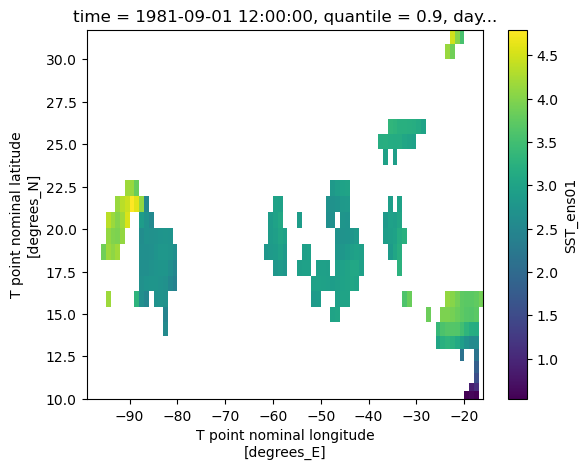

In [20]:
mhw_events[0][0].plot()

In [21]:
mean_mhw_temp

[<xarray.DataArray 'SST_ens01' (yT: 26, xT: 83)> Size: 17kB
 dask.array<mean_agg-aggregate, shape=(26, 83), dtype=float64, chunksize=(26, 83), chunktype=numpy.ndarray>
 Coordinates:
   * xT        (xT) float64 664B -98.5 -97.5 -96.5 -95.5 ... -18.5 -17.5 -16.5
   * yT        (yT) float64 208B 10.2 10.67 11.22 11.85 ... 29.59 30.46 31.31
     quantile  float64 8B ...,
 <xarray.DataArray 'SST_ens02' (yT: 26, xT: 83)> Size: 17kB
 dask.array<mean_agg-aggregate, shape=(26, 83), dtype=float64, chunksize=(26, 83), chunktype=numpy.ndarray>
 Coordinates:
   * xT        (xT) float64 664B -98.5 -97.5 -96.5 -95.5 ... -18.5 -17.5 -16.5
   * yT        (yT) float64 208B 10.2 10.67 11.22 11.85 ... 29.59 30.46 31.31
     quantile  float64 8B ...,
 <xarray.DataArray 'SST_ens03' (yT: 26, xT: 83)> Size: 17kB
 dask.array<mean_agg-aggregate, shape=(26, 83), dtype=float64, chunksize=(26, 83), chunktype=numpy.ndarray>
 Coordinates:
   * xT        (xT) float64 664B -98.5 -97.5 -96.5 -95.5 ... -18.5 -17.5 -16.5

In [27]:
%%time
#--------------------------------------- Frequency <1sec ------------------------------
years = detrended_splo[0].time.dt.year.values
nyears = np.unique(years).size #total time period
# compute event frequency for all ensemble members
event_freq_splo = [da_events / nyears for da_events in event_counts_splo]

CPU times: user 45.5 ms, sys: 12 ms, total: 57.5 ms
Wall time: 56.8 ms


In [28]:
%%time
#--------------------------------------- Intensity <1sec------------------------------
mhw_intensity_splo = []
for mhws, thresh in zip(mhw_events, threshold_splo):
    intensity = (mhws - thresh).mean(dim="time").rename(f'intensity_ens{mhws.name[-2:]}')
    mhw_intensity_splo.append(intensity)

CPU times: user 579 ms, sys: 12.9 ms, total: 591 ms
Wall time: 593 ms


### Plots

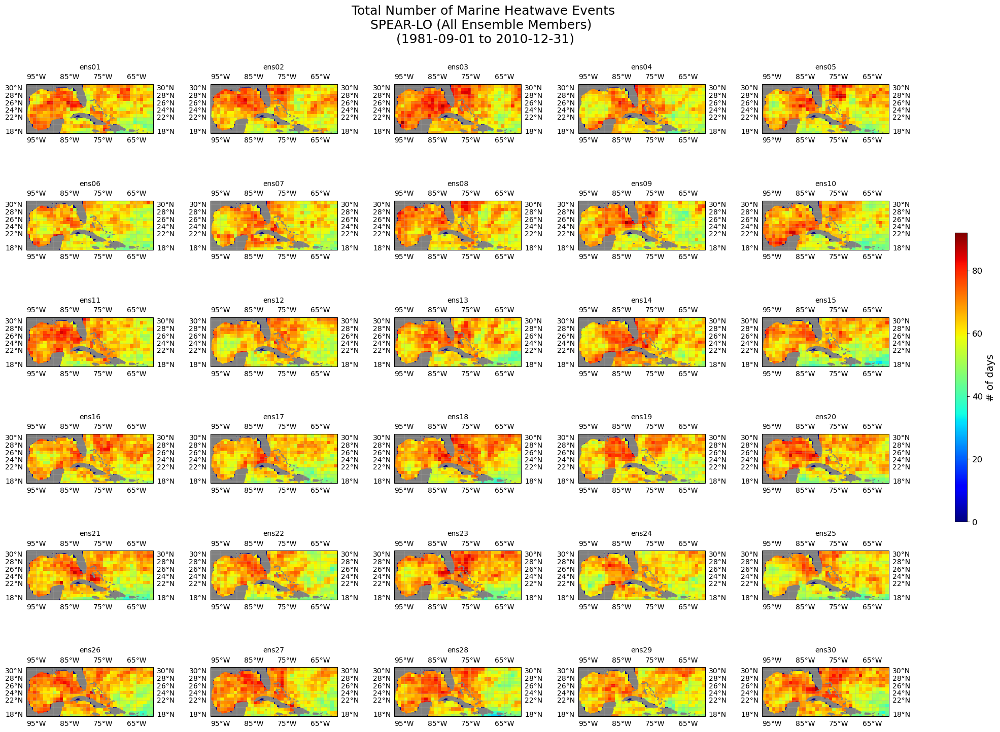

CPU times: user 40.4 s, sys: 1.88 s, total: 42.3 s
Wall time: 43.2 s


In [41]:
%%time
fig, ax = plt.subplots(6, 5, figsize=(20, 15), subplot_kw=dict(projection=ccrs.Mercator()))
ax_flat = ax.flatten()

# ---- shared normalization (CRITICAL for colorbar) ----
# temporarily stack ensemble members into one DataArray to get min/max
stacked = xr.concat(event_counts_splo, dim="ensemble") #xr creates an 'ens' dim to stack da's along
vmin = stacked.min().compute().item()
vmax = stacked.max().compute().item()
norm = mcolors.Normalize(vmin=vmin, vmax=vmax)

for i in range(30):
    ens_name = f"ens{i+1:02d}"
    title = f"{ens_name}"
    im = cartopy_plot(event_counts_splo[i], cmap_choice='jet', var_title=title, norm=norm, ax=ax_flat[i])

# ---- single shared colorbar ----
cbar_ax = fig.add_axes([0.965, 0.33, 0.012, 0.38]) # move: [to right, it up, make thinner, shorter]
cbar = fig.colorbar(im, cax=cbar_ax)
cbar.set_label('# of days', fontsize=14)
cbar.ax.tick_params(labelsize=12)

fig.suptitle("Total Number of Marine Heatwave Events\nSPEAR-LO (All Ensemble Members) \n (1981-09-01 to 2010-12-31)",
    fontsize=18, y=1.01)

# ---- spacing (Cartopy-safe) ----
fig.subplots_adjust(left=0.05, right=0.9, top=0.95, bottom=0.03, wspace=0.45, hspace=0.001)
plt.show()

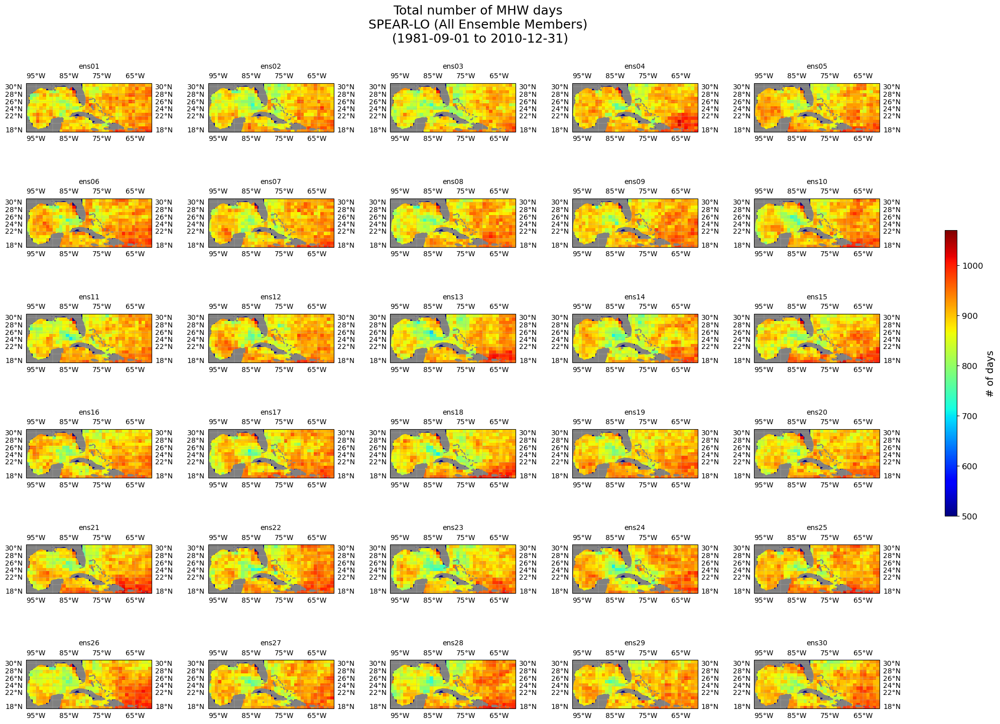

CPU times: user 16.7 s, sys: 2.77 s, total: 19.5 s
Wall time: 28 s


In [42]:
%%time
fig, ax = plt.subplots(6, 5, figsize=(20, 15), subplot_kw=dict(projection=ccrs.Mercator()))
ax_flat = ax.flatten()

# ---- shared normalization (CRITICAL for colorbar) ----
# temporarily stack ensemble members into one DataArray to get min/max
stacked = xr.concat(total_mhw_days, dim="ensemble")
vmin = stacked.min().compute().item()
vmax = stacked.max().compute().item()
norm = mcolors.Normalize(vmin=500, vmax=vmax)

for i in range(30):
    ens_name = f"ens{i+1:02d}"
    title = f"{ens_name}"
    im = cartopy_plot(total_mhw_days[i], cmap_choice='jet', var_title=title, norm=norm, ax=ax_flat[i])

# ---- single shared colorbar ----
cbar_ax = fig.add_axes([0.965, 0.33, 0.012, 0.38]) # move: [to right, it up, make thinner, shorter]
cbar = fig.colorbar(im, cax=cbar_ax)
cbar.set_label('# of days', fontsize=14)
cbar.ax.tick_params(labelsize=12)

fig.suptitle("Total number of MHW days\n SPEAR-LO (All Ensemble Members) \n (1981-09-01 to 2010-12-31)",
    fontsize=18, y=1.01)

# ---- spacing (Cartopy-safe) ----
fig.subplots_adjust(left=0.05, right=0.9, top=0.95, bottom=0.03, wspace=0.45, hspace=0.001)
plt.show()

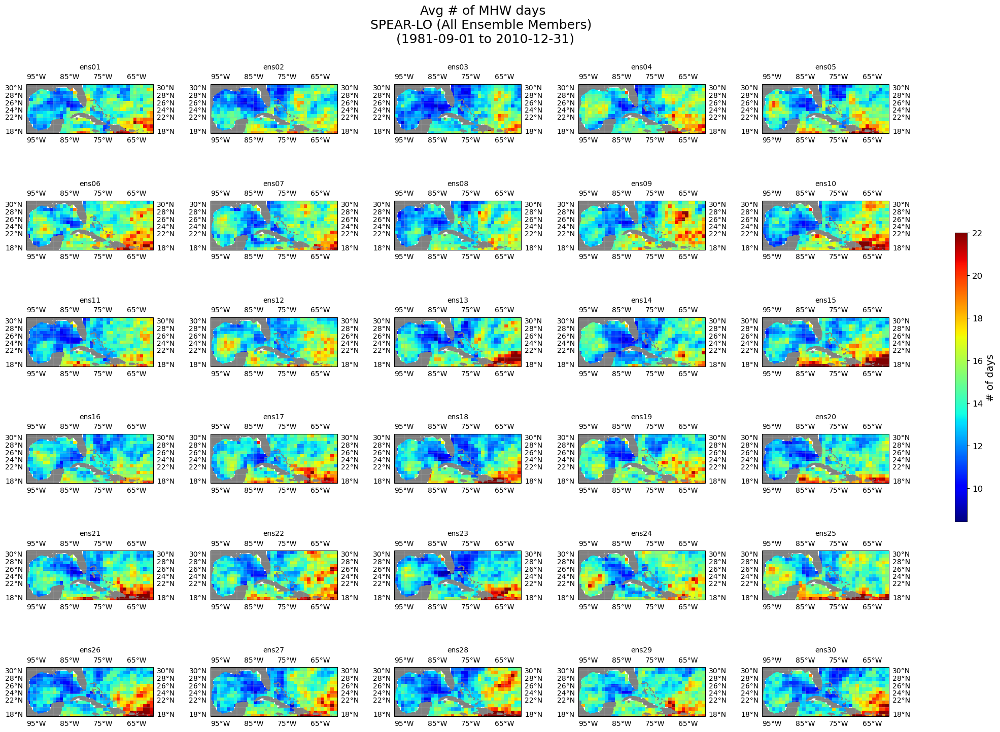

CPU times: user 13.2 s, sys: 48.6 ms, total: 13.3 s
Wall time: 13.4 s


In [43]:
%%time
fig, ax = plt.subplots(6, 5, figsize=(20, 15), subplot_kw=dict(projection=ccrs.Mercator()))
ax_flat = ax.flatten()

# ---- shared normalization (CRITICAL for colorbar) ----
# temporarily stack ensemble members into one DataArray to get min/max
vmin = mean_duration.min().item()
vmax = mean_duration.max().item()
norm = mcolors.Normalize(vmin=vmin, vmax=22)

for i in range(30):
    ens_name = f"ens{i+1:02d}"
    title = f"{ens_name}"
    im = cartopy_plot(mean_duration.isel(ensemble=i), cmap_choice='jet', var_title=title, 
                      norm=norm, ax=ax_flat[i])

# ---- single shared colorbar ----
cbar_ax = fig.add_axes([0.965, 0.33, 0.012, 0.38]) # move: [to right, it up, make thinner, shorter]
cbar = fig.colorbar(im, cax=cbar_ax)
cbar.set_label('# of days', fontsize=14)
cbar.ax.tick_params(labelsize=12)

fig.suptitle("Avg # of MHW days\nSPEAR-LO (All Ensemble Members) \n (1981-09-01 to 2010-12-31)",
    fontsize=18, y=1.01)

# ---- spacing (Cartopy-safe) ----
fig.subplots_adjust(left=0.05, right=0.9, top=0.95, bottom=0.03, wspace=0.45, hspace=0.001)
plt.show()

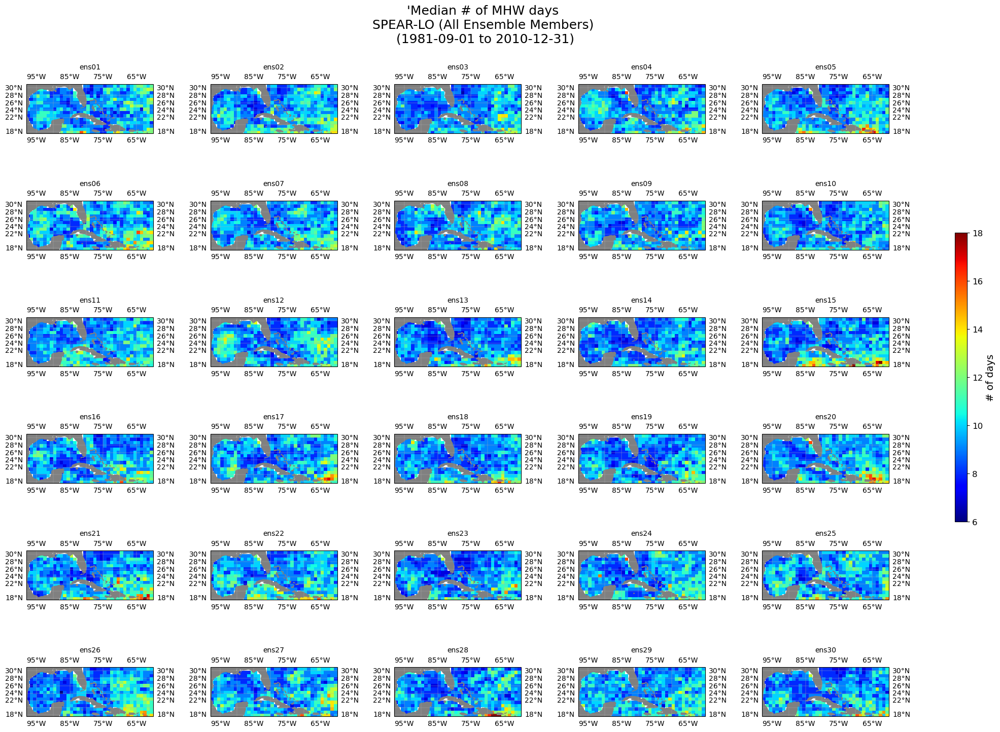

CPU times: user 13.1 s, sys: 47.9 ms, total: 13.2 s
Wall time: 13.3 s


In [44]:
%%time
fig, ax = plt.subplots(6, 5, figsize=(20, 15), subplot_kw=dict(projection=ccrs.Mercator()))
ax_flat = ax.flatten()

# ---- shared normalization (CRITICAL for colorbar) ----
# temporarily stack ensemble members into one DataArray to get min/max
vmin = median_duration.min().item()
vmax = median_duration.max().item()
norm = mcolors.Normalize(vmin=6, vmax=18) #extreme outliers skew cmap so manually enter values

for i in range(30):
    ens_name = f"ens{i+1:02d}"
    title = f"{ens_name}"
    im = cartopy_plot(median_duration.isel(ensemble=i), cmap_choice='jet', var_title=title, 
                      norm=norm, ax=ax_flat[i])

# ---- single shared colorbar ----
cbar_ax = fig.add_axes([0.965, 0.33, 0.012, 0.38]) # move: [to right, it up, make thinner, shorter]
cbar = fig.colorbar(im, cax=cbar_ax)
cbar.set_label('# of days', fontsize=14)
cbar.ax.tick_params(labelsize=12)

fig.suptitle("'Median # of MHW days\n SPEAR-LO (All Ensemble Members) \n (1981-09-01 to 2010-12-31)",
    fontsize=18, y=1.01)

# ---- spacing (Cartopy-safe) ----
fig.subplots_adjust(left=0.05, right=0.9, top=0.95, bottom=0.03, wspace=0.45, hspace=0.001)
plt.show()

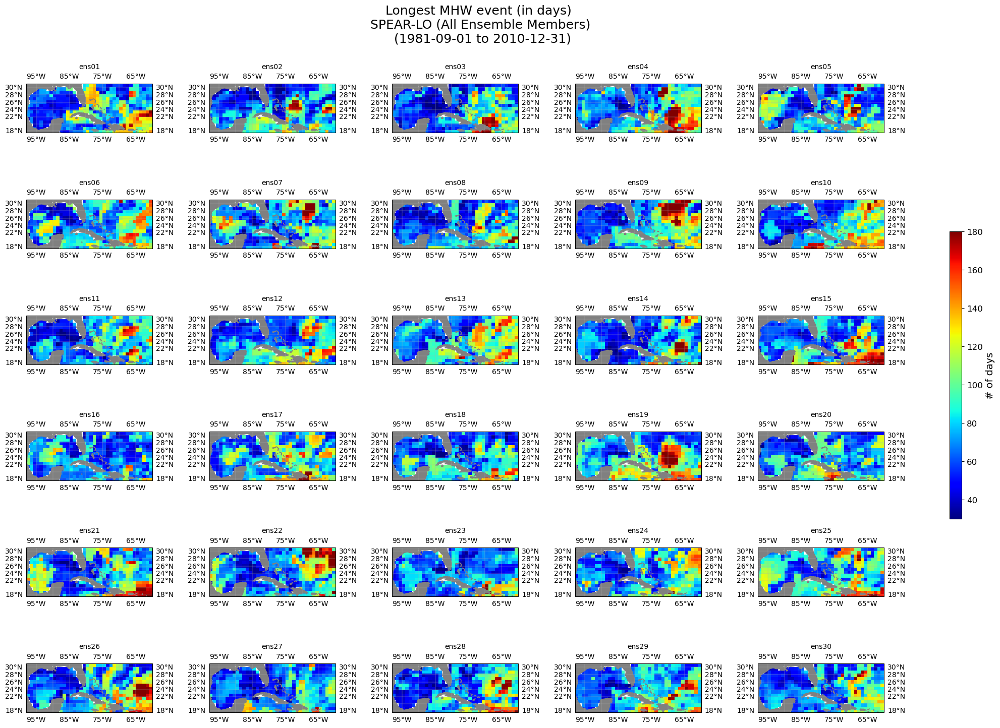

CPU times: user 13.4 s, sys: 165 ms, total: 13.5 s
Wall time: 15.5 s


In [47]:
%%time
fig, ax = plt.subplots(6, 5, figsize=(20, 15), subplot_kw=dict(projection=ccrs.Mercator()))
ax_flat = ax.flatten()

# ---- shared normalization (CRITICAL for colorbar) ----
# temporarily stack ensemble members into one DataArray to get min/max
vmin = max_duration.min().item()
vmax = max_duration.max().item()
norm = mcolors.Normalize(vmin=30, vmax=180) #extreme outliers skew cmap so manually enter values

for i in range(30):
    ens_name = f"ens{i+1:02d}"
    title = f"{ens_name}"
    im = cartopy_plot(max_duration.isel(ensemble=i), cmap_choice='jet', var_title=title, 
                      norm=norm, ax=ax_flat[i])

# ---- single shared colorbar ----
#move[to right, it up, make thinner, shorter][left, bottom, width, height]
cbar_ax = fig.add_axes([0.965, 0.33, 0.012, 0.38]) 
cbar = fig.colorbar(im, cax=cbar_ax)
cbar.set_label('# of days', fontsize=14)
cbar.ax.tick_params(labelsize=12)

fig.suptitle("Longest MHW event (in days) \n SPEAR-LO (All Ensemble Members) \n (1981-09-01 to 2010-12-31)",
    fontsize=18, y=1.01)

# ---- spacing (Cartopy-safe) ----
fig.subplots_adjust(left=0.05, right=0.9, top=0.95, bottom=0.03, wspace=0.45, hspace=0.001)
plt.show()

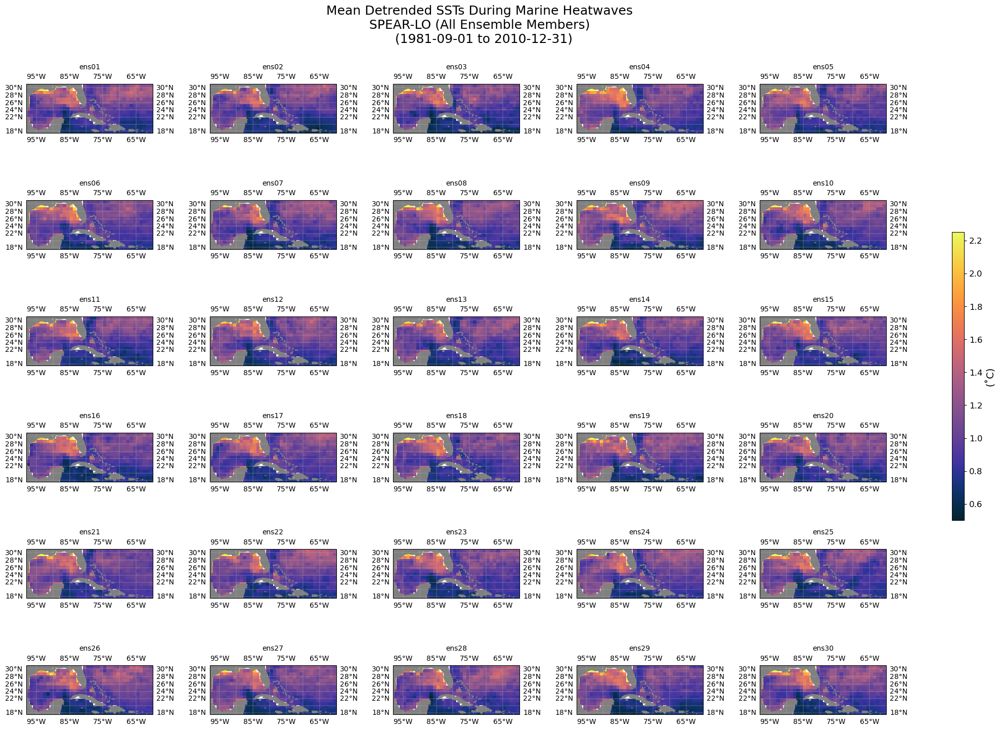

CPU times: user 41.8 s, sys: 57.9 s, total: 1min 39s
Wall time: 2min 43s


In [46]:
%%time
fig, ax = plt.subplots(6, 5, figsize=(20, 15), subplot_kw=dict(projection=ccrs.Mercator()))
ax_flat = ax.flatten()

# ---- shared normalization (CRITICAL for colorbar) ----
# temporarily stack ensemble members into one DataArray to get min/max
stacked = xr.concat(mean_mhw_temp, dim="ensemble") #xr creates an 'ens' dim to stack da's along
vmin = stacked.min().compute().item()
vmax = stacked.max().compute().item()
norm = mcolors.Normalize(vmin=0.5, vmax=2.25)

for i in range(30):
    ens_name = f"ens{i+1:02d}"
    title = f"{ens_name}"
    im = cartopy_plot(mean_mhw_temp[i], cmap_choice=cmocean.cm.thermal, var_title=title, norm=norm, ax=ax_flat[i])

# ---- single shared colorbar ----
cbar_ax = fig.add_axes([0.965, 0.33, 0.012, 0.38]) # [left, bottom, width, height]
cbar = fig.colorbar(im, cax=cbar_ax)
cbar.set_label('(˚C)', fontsize=14)
cbar.ax.tick_params(labelsize=12)

fig.suptitle("Mean Detrended SSTs During Marine Heatwaves \nSPEAR-LO (All Ensemble Members) \n (1981-09-01 to 2010-12-31)",
    fontsize=18, y=1.01)

# ---- spacing (Cartopy-safe) ----
fig.subplots_adjust(left=0.05, right=0.9, top=0.95, bottom=0.03, wspace=0.45, hspace=0.001)
plt.show()

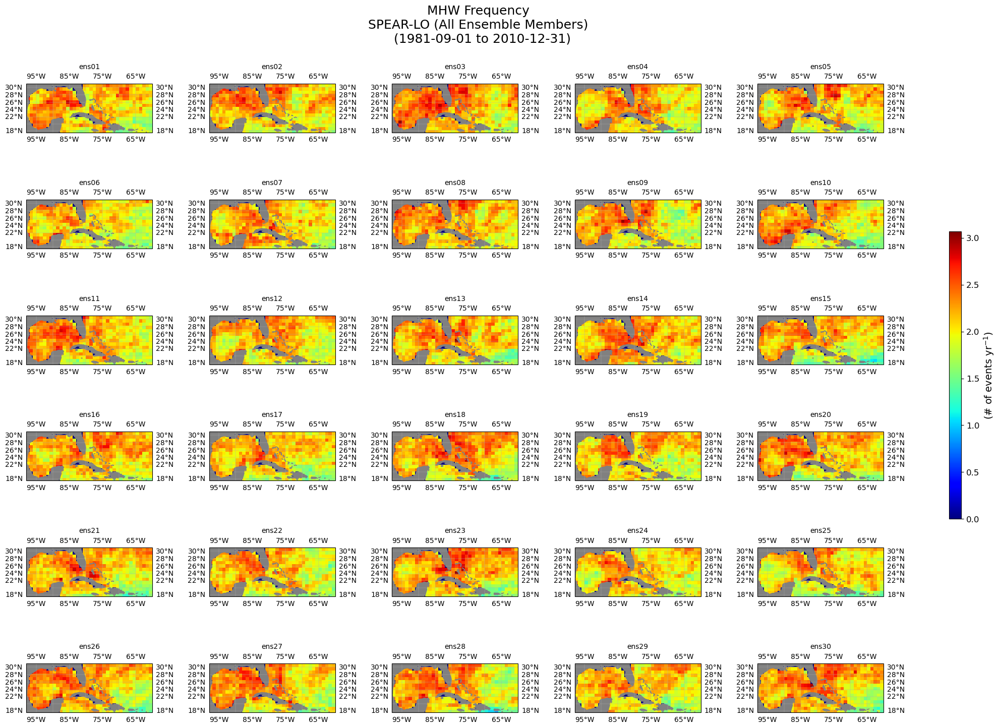

CPU times: user 44.7 s, sys: 3.07 s, total: 47.7 s
Wall time: 1min 52s


In [48]:
%%time
fig, ax = plt.subplots(6, 5, figsize=(20, 15), subplot_kw=dict(projection=ccrs.Mercator()))
ax_flat = ax.flatten()

# ---- shared normalization (CRITICAL for colorbar) ----
# temporarily stack ensemble members into one DataArray to get min/max
stacked = xr.concat(event_freq_splo, dim="ensemble") #xr creates an 'ens' dim to stack da's along
vmin = stacked.min().compute().item()
vmax = stacked.max().compute().item()
norm = mcolors.Normalize(vmin=vmin, vmax=vmax)

for i in range(30):
    ens_name = f"ens{i+1:02d}"
    title = f"{ens_name}"
    im = cartopy_plot(event_freq_splo[i], cmap_choice='jet', var_title=title, norm=norm, ax=ax_flat[i])

# ---- single shared colorbar ----
cbar_ax = fig.add_axes([0.965, 0.33, 0.012, 0.38]) # [left, bottom, width, height]
cbar = fig.colorbar(im, cax=cbar_ax)
cbar.set_label(r'(# of events yr$^{-1}$)', fontsize=14)
cbar.ax.tick_params(labelsize=12)

fig.suptitle("MHW Frequency \nSPEAR-LO (All Ensemble Members) \n (1981-09-01 to 2010-12-31)",
    fontsize=18, y=1.01)

# ---- spacing (Cartopy-safe) ----
fig.subplots_adjust(left=0.05, right=0.9, top=0.95, bottom=0.03, wspace=0.45, hspace=0.001)
plt.show()

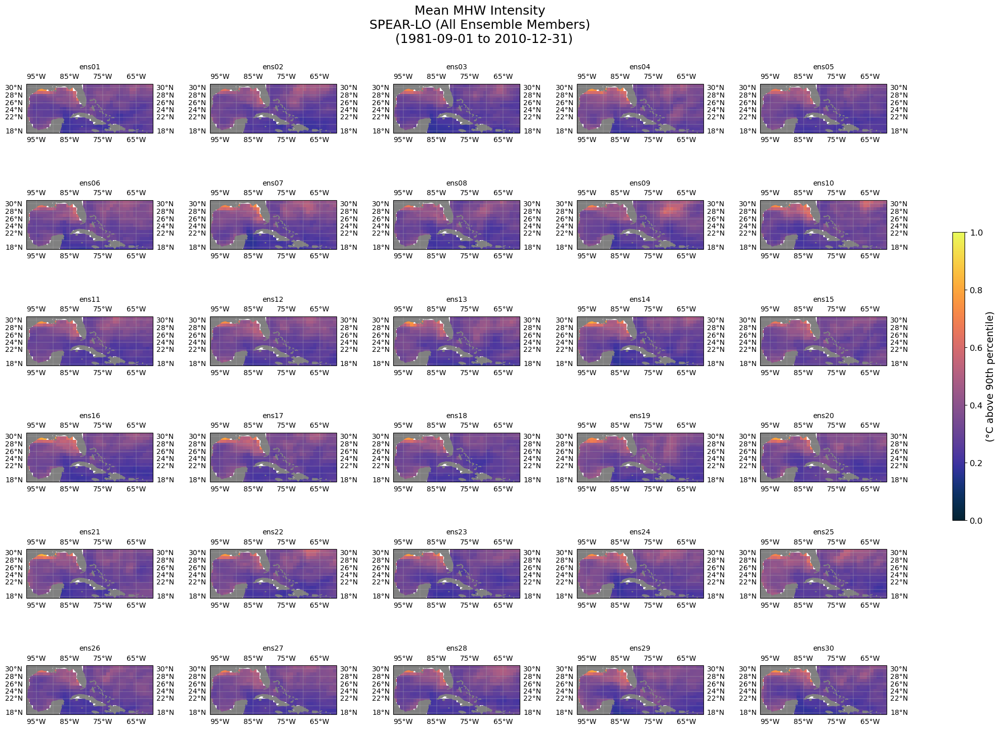

CPU times: user 30.2 s, sys: 44 s, total: 1min 14s
Wall time: 2min 48s


In [49]:
%%time
fig, ax = plt.subplots(6, 5, figsize=(20, 15), subplot_kw=dict(projection=ccrs.Mercator()))
ax_flat = ax.flatten()

norm = mcolors.Normalize(vmin=0, vmax=1)

for i in range(30):
    ens_name = f"ens{i+1:02d}"
    title = f"{ens_name}"
    im = cartopy_plot(mhw_intensity_splo[i], cmap_choice=cmocean.cm.thermal, 
                      var_title=title, norm=norm, ax=ax_flat[i])

# ---- single shared colorbar ----
cbar_ax = fig.add_axes([0.965, 0.33, 0.012, 0.38]) # [left, bottom, width, height]
cbar = fig.colorbar(im, cax=cbar_ax)
cbar.set_label('(°C above 90th percentile)', fontsize=14)
cbar.ax.tick_params(labelsize=12)

fig.suptitle("Mean MHW Intensity \nSPEAR-LO (All Ensemble Members) \n (1981-09-01 to 2010-12-31)",
    fontsize=18, y=1.01)

# ---- spacing (Cartopy-safe) ----
fig.subplots_adjust(left=0.05, right=0.9, top=0.95, bottom=0.03, wspace=0.45, hspace=0.001)
plt.show()

### Extra maps

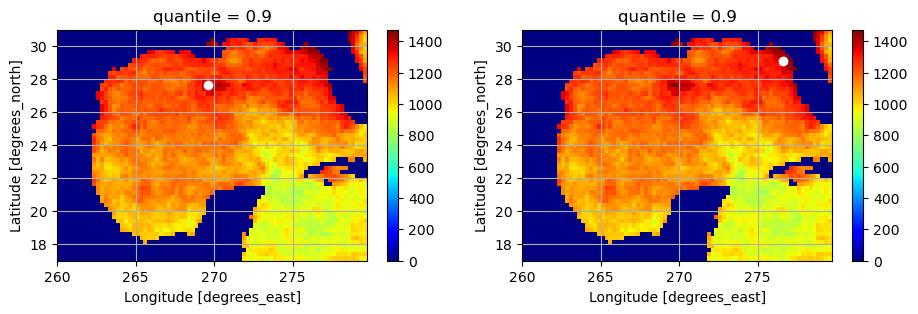

In [53]:
fig, (ax0,ax1) = plt.subplots(1,2, figsize=(11, 3))
total_mhw_days.plot(cmap='jet', ax=ax0)
ax0.grid()
ax0.plot(269.625, 27.625, 'wo')

total_mhw_days.plot(cmap='jet', ax=ax1)
ax1.grid()
ax1.plot(276.625, 29.125, 'wo');

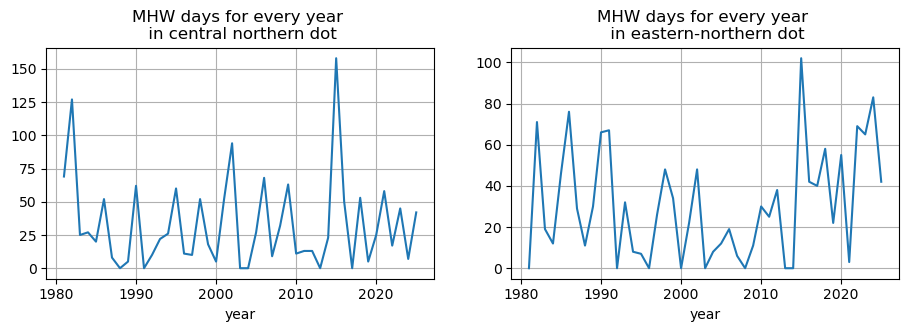

In [55]:
fig, (ax0,ax1) = plt.subplots(1,2, figsize=(11, 3))
event_mask.sel(lat=27.625, lon=269.625).groupby('time.year').sum('time').plot(ax=ax0)
ax0.grid()
ax0.set_title('MHW days for every year \n in central northern dot')
event_mask.sel(lat=29.125, lon=276.625).groupby('time.year').sum('time').plot(ax=ax1)
ax1.grid()
ax1.set_title('MHW days for every year \n in eastern-northern dot');

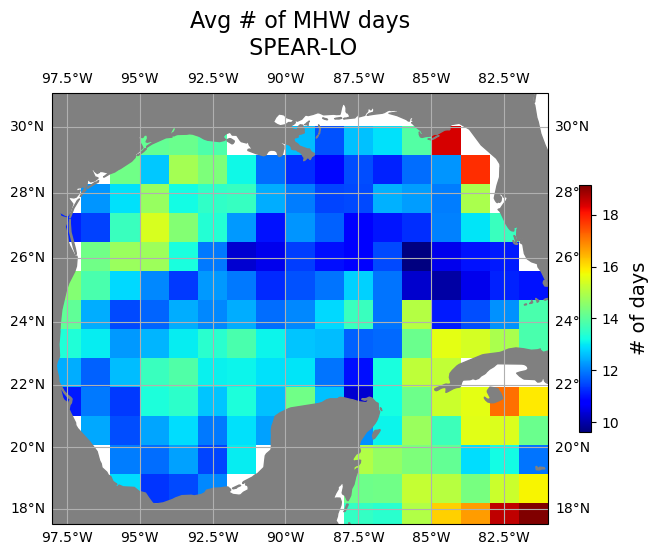

In [33]:
cartopy_plot(mean_duration, 'xT', 'yT', 'jet', '# of days', 
             'Avg # of MHW days\n SPEAR-LO')#,vmin=0, vmax=14,);#if time res is daily


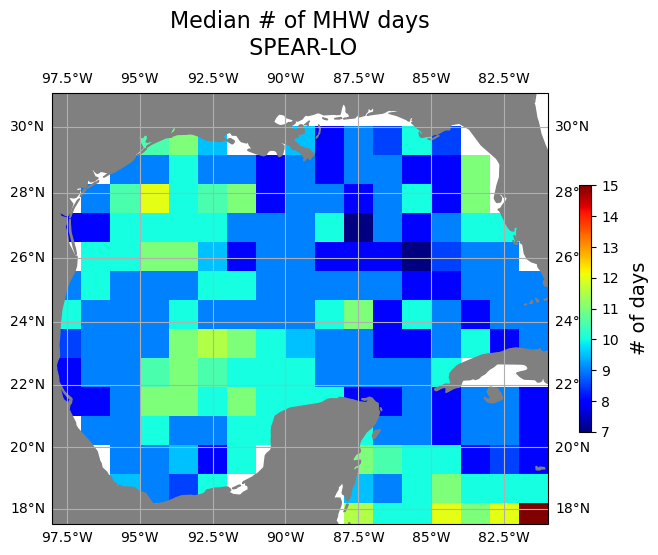

In [34]:
cartopy_plot(median_duration, 'xT', 'yT', 'jet', '# of days', 
             'Median # of MHW days\n SPEAR-LO');#if time res is daily


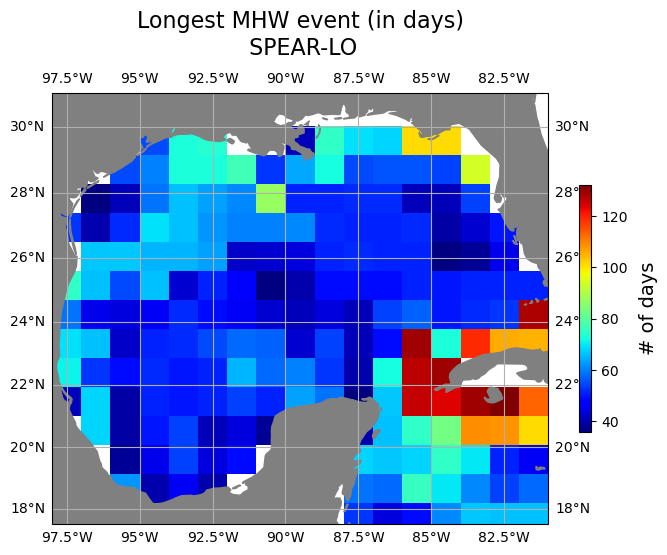

In [35]:
cartopy_plot(max_duration, 'xT', 'yT', 'jet', '# of days', 
             'Longest MHW event (in days)\n SPEAR-LO');#if time res is daily


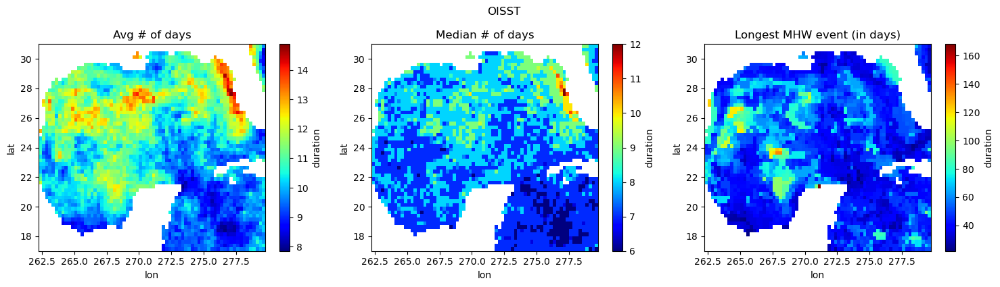

In [43]:
fig, ax = plt.subplots(1,3, figsize=(15,4))
mean_duration.plot(ax=ax[0], cmap='jet')
ax[0].set_title('Avg # of days')
median_duration.plot(ax=ax[1], cmap='jet')
ax[1].set_title('Median # of days')
max_duration.plot(ax=ax[2], cmap='jet')
ax[2].set_title('Longest MHW event (in days)')
plt.tight_layout()
plt.suptitle('OISST', y=1.05);

## BIAS MAPS
- Interpolate `OISST` onto `SPEAR-LO` grid (New maps below originals in `OISST` section)
- Take difference between `OISST` and `SPEAR-LO`

In [29]:
spear_lo_grid = event_counts_splo[0].rename({'yT':'lat', 'xT':'lon'})

regridder_oi = xe.Regridder(event_count_oi, spear_lo_grid, method='bilinear')
ev_ct_oi_ng = regridder_oi(event_count_oi)

regridder_oi = xe.Regridder(total_mhw_days_oi, spear_lo_grid, method='bilinear')
tot_mhw_days_oi_ng = regridder_oi(total_mhw_days_oi)

regridder_oi = xe.Regridder(mean_duration_oi, spear_lo_grid, method='bilinear')
mean_dur_oi_ng = regridder_oi(mean_duration_oi)

regridder_oi = xe.Regridder(median_duration_oi, spear_lo_grid, method='bilinear')
med_dur_oi_ng = regridder_oi(median_duration_oi)

regridder_oi = xe.Regridder(max_duration_oi, spear_lo_grid, method='bilinear')
max_dur_oi_ng = regridder_oi(max_duration_oi)

regridder_oi = xe.Regridder(mean_mhw_temp_oi, spear_lo_grid, method='bilinear')
mean_mhw_tmp_oi_ng = regridder_oi(mean_mhw_temp_oi)

regridder_oi = xe.Regridder(event_freq_oi, spear_lo_grid, method='bilinear')
ev_freq_oi_ng = regridder_oi(event_freq_oi)

regridder_oi = xe.Regridder(mhw_intensity_oi, spear_lo_grid, method='bilinear')
mhw_int_oi_ng = regridder_oi(mhw_intensity_oi)

In [30]:
ev_ct_bias = [da - ev_ct_oi_ng.rename({'lat':'yT', 'lon':'xT'}) for da in event_counts_splo]
tot_mhw_days_bias = [da - tot_mhw_days_oi_ng.rename({'lat':'yT', 'lon':'xT'}) for da in total_mhw_days]
mean_dur_bias = mean_duration - mean_dur_oi_ng.rename({'lat':'yT', 'lon':'xT'}) 
med_dur_bias = mean_duration - med_dur_oi_ng.rename({'lat':'yT', 'lon':'xT'})
max_dur_bias = mean_duration - max_dur_oi_ng.rename({'lat':'yT', 'lon':'xT'})
mean_mhw_tmp_bias = [da - mean_mhw_tmp_oi_ng.rename({'lat':'yT', 'lon':'xT'}) for da in mean_mhw_temp]
ev_freq_bias = [da - ev_freq_oi_ng.rename({'lat':'yT', 'lon':'xT'}) for da in event_freq_splo]
mhw_int_bias = [da - mhw_int_oi_ng.rename({'lat':'yT', 'lon':'xT'}) for da in mhw_intensity_splo]

In [60]:
mhw_int_bias

[<xarray.DataArray (yT: 26, xT: 83)> Size: 17kB
 dask.array<sub, shape=(26, 83), dtype=float64, chunksize=(26, 83), chunktype=numpy.ndarray>
 Coordinates:
   * xT        (xT) float64 664B -98.5 -97.5 -96.5 -95.5 ... -18.5 -17.5 -16.5
   * yT        (yT) float64 208B 10.2 10.67 11.22 11.85 ... 29.59 30.46 31.31
     quantile  float64 8B 0.9,
 <xarray.DataArray (yT: 26, xT: 83)> Size: 17kB
 dask.array<sub, shape=(26, 83), dtype=float64, chunksize=(26, 83), chunktype=numpy.ndarray>
 Coordinates:
   * xT        (xT) float64 664B -98.5 -97.5 -96.5 -95.5 ... -18.5 -17.5 -16.5
   * yT        (yT) float64 208B 10.2 10.67 11.22 11.85 ... 29.59 30.46 31.31
     quantile  float64 8B 0.9,
 <xarray.DataArray (yT: 26, xT: 83)> Size: 17kB
 dask.array<sub, shape=(26, 83), dtype=float64, chunksize=(26, 83), chunktype=numpy.ndarray>
 Coordinates:
   * xT        (xT) float64 664B -98.5 -97.5 -96.5 -95.5 ... -18.5 -17.5 -16.5
   * yT        (yT) float64 208B 10.2 10.67 11.22 11.85 ... 29.59 30.46 31.31
  

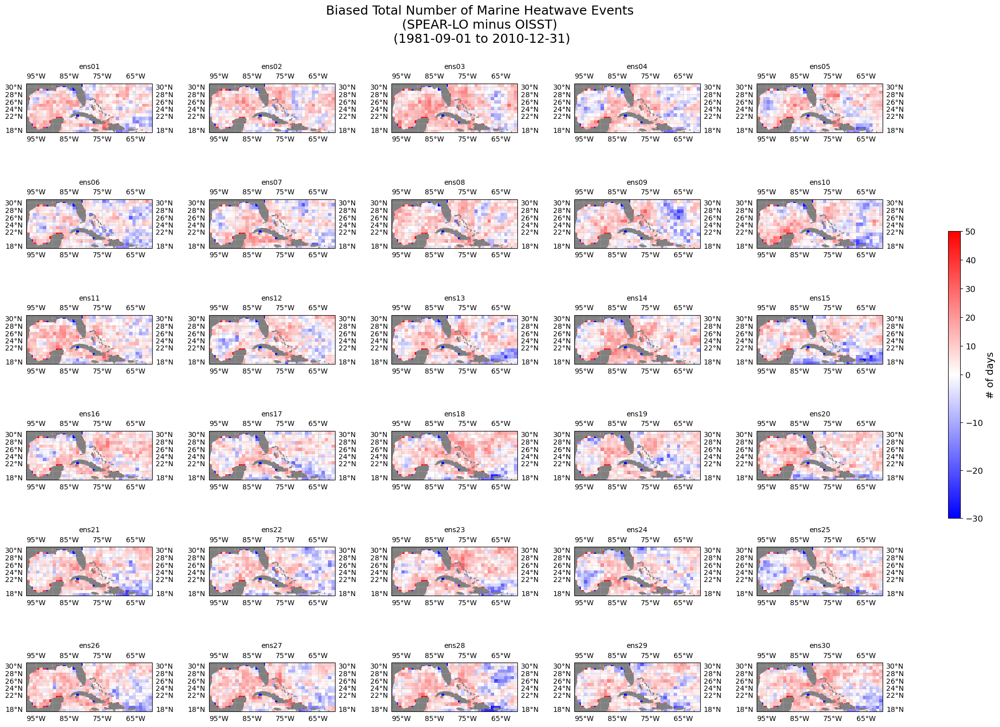

CPU times: user 24.9 s, sys: 1.93 s, total: 26.9 s
Wall time: 37 s


In [61]:
%%time
fig, ax = plt.subplots(6, 5, figsize=(20, 15), subplot_kw=dict(projection=ccrs.Mercator()))
ax_flat = ax.flatten()

norm = TwoSlopeNorm(vmin=-30, vcenter=0, vmax=50)

for i in range(30):
    ens_name = f"ens{i+1:02d}"
    title = f"{ens_name}"
    im = cartopy_plot(ev_ct_bias[i], cmap_choice='bwr', var_title=title, norm=norm, ax=ax_flat[i])

# ---- single shared colorbar ----
cbar_ax = fig.add_axes([0.965, 0.33, 0.012, 0.38]) # [left, bottom, width, height]
cbar = fig.colorbar(im, cax=cbar_ax)
cbar.set_label('# of days', fontsize=14)
cbar.ax.tick_params(labelsize=12)

fig.suptitle("Biased Total Number of Marine Heatwave Events\n (SPEAR-LO minus OISST) \n (1981-09-01 to 2010-12-31)",
    fontsize=18, y=1.01)

# ---- spacing (Cartopy-safe) ----
fig.subplots_adjust(left=0.05, right=0.9, top=0.95, bottom=0.03, wspace=0.45, hspace=0.001)
plt.show()

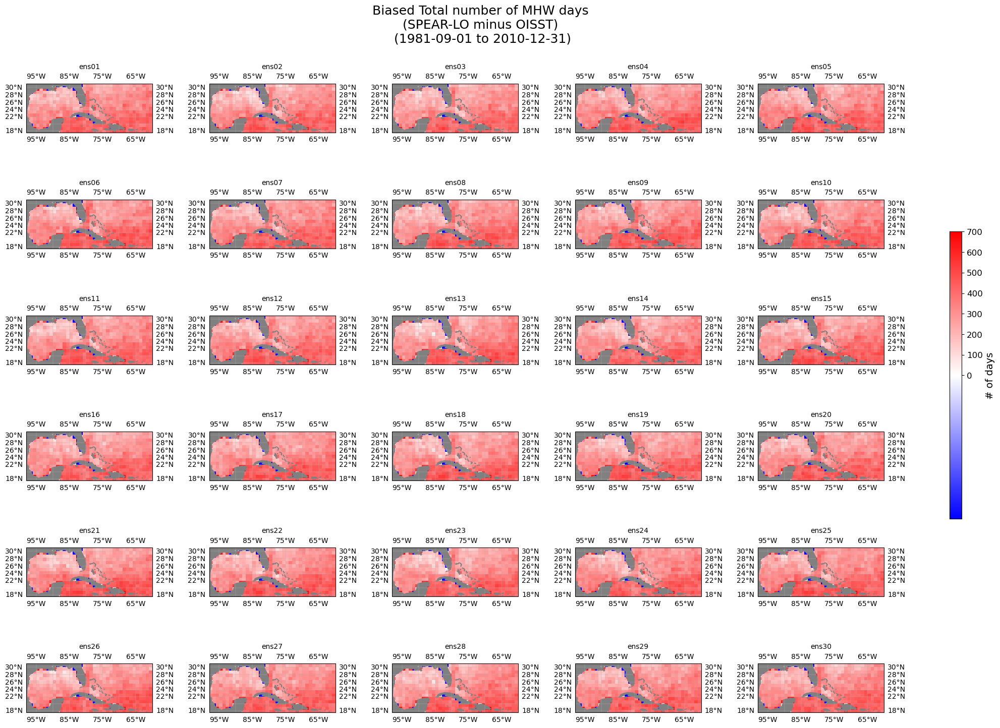

CPU times: user 13.3 s, sys: 1.23 s, total: 14.5 s
Wall time: 20.2 s


In [62]:
%%time
fig, ax = plt.subplots(6, 5, figsize=(20, 15), subplot_kw=dict(projection=ccrs.Mercator()))
ax_flat = ax.flatten()

norm = TwoSlopeNorm(vmin=-10, vcenter=0, vmax=700)

for i in range(30):
    ens_name = f"ens{i+1:02d}"
    title = f"{ens_name}"
    im = cartopy_plot(tot_mhw_days_bias[i], cmap_choice='bwr', var_title=title, norm=norm, ax=ax_flat[i])

# ---- single shared colorbar ----
cbar_ax = fig.add_axes([0.965, 0.33, 0.012, 0.38]) # [left, bottom, width, height]
cbar = fig.colorbar(im, cax=cbar_ax)
cbar.set_label('# of days', fontsize=14)
cbar.ax.tick_params(labelsize=12)

fig.suptitle("Biased Total number of MHW days\n (SPEAR-LO minus OISST) \n (1981-09-01 to 2010-12-31)",
    fontsize=18, y=1.01)

# ---- spacing (Cartopy-safe) ----
fig.subplots_adjust(left=0.05, right=0.9, top=0.95, bottom=0.03, wspace=0.45, hspace=0.001)
plt.show()

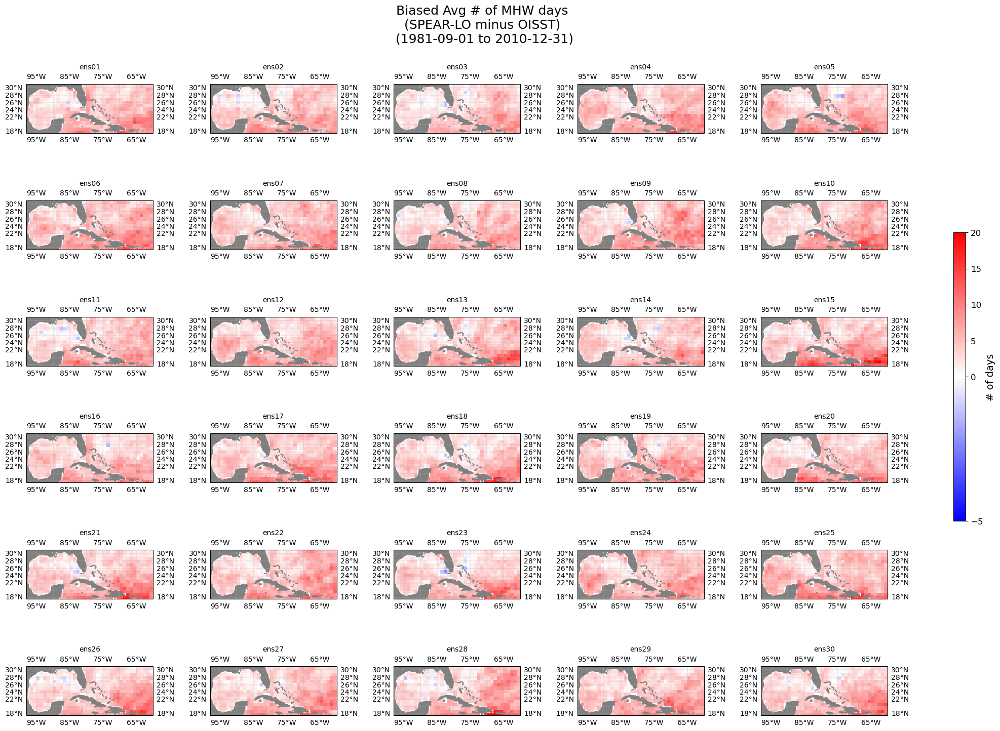

CPU times: user 12 s, sys: 62.5 ms, total: 12 s
Wall time: 13.3 s


In [65]:
%%time
fig, ax = plt.subplots(6, 5, figsize=(20, 15), subplot_kw=dict(projection=ccrs.Mercator()))
ax_flat = ax.flatten()

norm = TwoSlopeNorm(vmin=-5, vcenter=0, vmax=20)

for i in range(30):
    ens_name = f"ens{i+1:02d}"
    title = f"{ens_name}"
    im = cartopy_plot(mean_dur_bias.isel(ensemble=i), cmap_choice='bwr', var_title=title, 
                      norm=norm, ax=ax_flat[i])

# ---- single shared colorbar ----
cbar_ax = fig.add_axes([0.965, 0.33, 0.012, 0.38]) # [left, bottom, width, height]
cbar = fig.colorbar(im, cax=cbar_ax)
cbar.set_label('# of days', fontsize=14)
cbar.ax.tick_params(labelsize=12)

fig.suptitle("Biased Avg # of MHW days\n (SPEAR-LO minus OISST) \n (1981-09-01 to 2010-12-31)",
    fontsize=18, y=1.01)

# ---- spacing (Cartopy-safe) ----
fig.subplots_adjust(left=0.05, right=0.9, top=0.95, bottom=0.03, wspace=0.45, hspace=0.001)
plt.show()

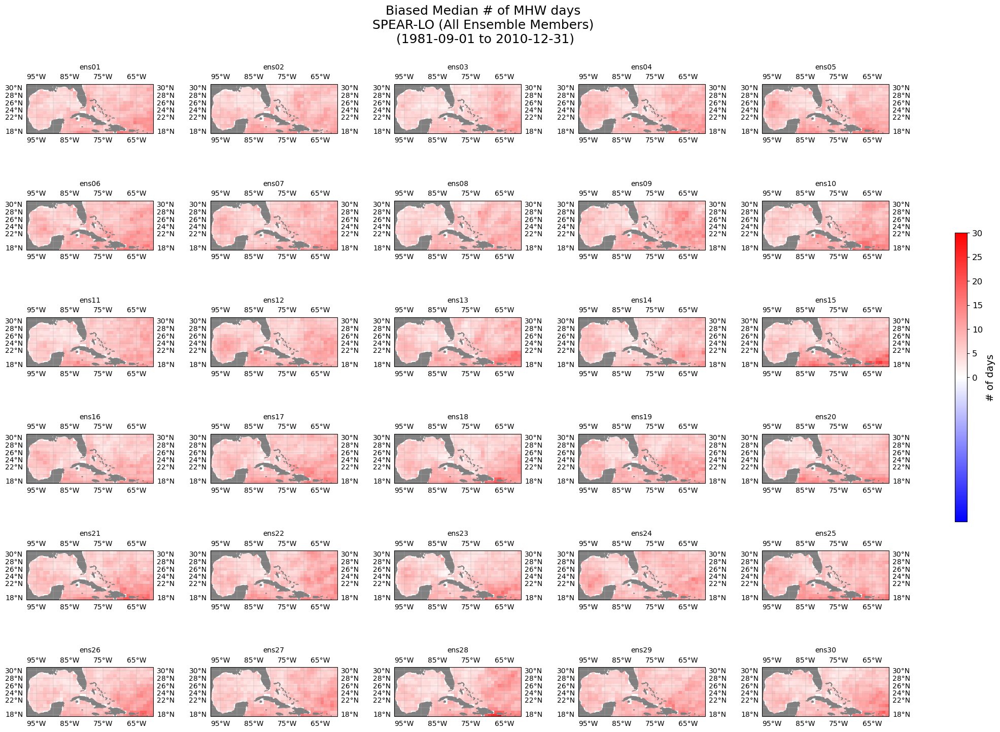

CPU times: user 13.9 s, sys: 36.7 ms, total: 14 s
Wall time: 14.1 s


In [73]:
%%time
fig, ax = plt.subplots(6, 5, figsize=(20, 15), subplot_kw=dict(projection=ccrs.Mercator()))
ax_flat = ax.flatten()

norm = TwoSlopeNorm(vmin=-1, vcenter=0, vmax=30)

for i in range(30):
    ens_name = f"ens{i+1:02d}"
    title = f"{ens_name}"
    im = cartopy_plot(med_dur_bias.isel(ensemble=i), cmap_choice='bwr', var_title=title, 
                      norm=norm, ax=ax_flat[i])

# ---- single shared colorbar ----
cbar_ax = fig.add_axes([0.965, 0.33, 0.012, 0.38]) # [left, bottom, width, height]
cbar = fig.colorbar(im, cax=cbar_ax)
cbar.set_label('# of days', fontsize=14)
cbar.ax.tick_params(labelsize=12)

fig.suptitle("Biased Median # of MHW days\n SPEAR-LO (All Ensemble Members) \n (1981-09-01 to 2010-12-31)",
    fontsize=18, y=1.01)

# ---- spacing (Cartopy-safe) ----
fig.subplots_adjust(left=0.05, right=0.9, top=0.95, bottom=0.03, wspace=0.45, hspace=0.001)
plt.show()

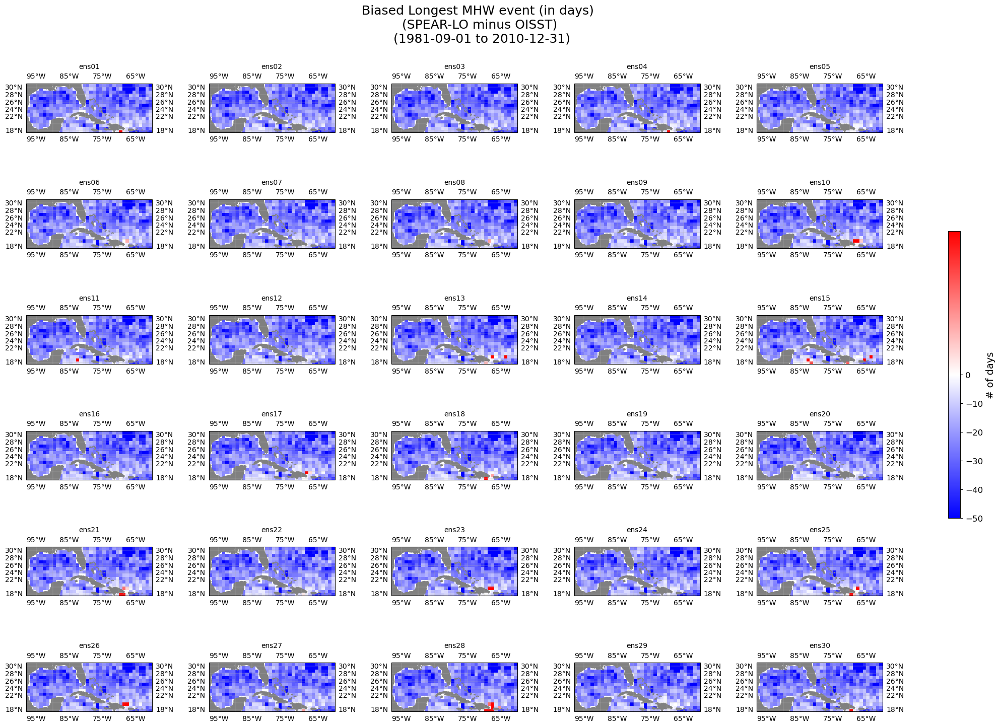

CPU times: user 13.7 s, sys: 61.1 ms, total: 13.8 s
Wall time: 13.8 s


In [72]:
%%time
fig, ax = plt.subplots(6, 5, figsize=(20, 15), subplot_kw=dict(projection=ccrs.Mercator()))
ax_flat = ax.flatten()

norm = TwoSlopeNorm(vmin=-50, vcenter=0, vmax=1)

for i in range(30):
    ens_name = f"ens{i+1:02d}"
    title = f"{ens_name}"
    im = cartopy_plot(max_dur_bias.isel(ensemble=i), cmap_choice='bwr', var_title=title, 
                      norm=norm, ax=ax_flat[i])

# ---- single shared colorbar ----
cbar_ax = fig.add_axes([0.965, 0.33, 0.012, 0.38]) # [left, bottom, width, height]
cbar = fig.colorbar(im, cax=cbar_ax)
cbar.set_label('# of days', fontsize=14)
cbar.ax.tick_params(labelsize=12)

fig.suptitle("Biased Longest MHW event (in days) \n (SPEAR-LO minus OISST) \n (1981-09-01 to 2010-12-31)",
    fontsize=18, y=1.01)

# ---- spacing (Cartopy-safe) ----
fig.subplots_adjust(left=0.05, right=0.9, top=0.95, bottom=0.03, wspace=0.45, hspace=0.001)
plt.show()

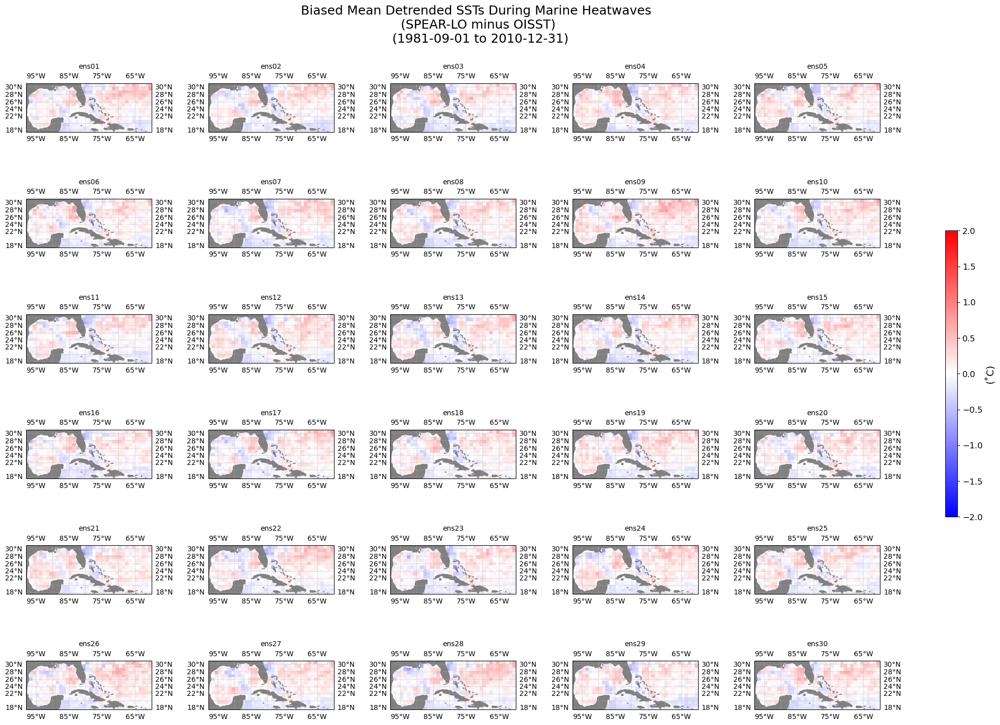

CPU times: user 26.3 s, sys: 25.1 s, total: 51.4 s
Wall time: 1min 18s


In [69]:
%%time
fig, ax = plt.subplots(6, 5, figsize=(20, 15), subplot_kw=dict(projection=ccrs.Mercator()))
ax_flat = ax.flatten()

norm = TwoSlopeNorm(vmin=-2, vcenter=0, vmax=2)

for i in range(30):
    ens_name = f"ens{i+1:02d}"
    title = f"{ens_name}"
    im = cartopy_plot(mean_mhw_tmp_bias[i], cmap_choice='bwr', var_title=title, norm=norm, ax=ax_flat[i])

# ---- single shared colorbar ----
cbar_ax = fig.add_axes([0.965, 0.33, 0.012, 0.38]) # [left, bottom, width, height]
cbar = fig.colorbar(im, cax=cbar_ax)
cbar.set_label('(˚C)', fontsize=14)
cbar.ax.tick_params(labelsize=12)

fig.suptitle("Biased Mean Detrended SSTs During Marine Heatwaves \n (SPEAR-LO minus OISST) \n (1981-09-01 to 2010-12-31)",
    fontsize=18, y=1.01)

# ---- spacing (Cartopy-safe) ----
fig.subplots_adjust(left=0.05, right=0.9, top=0.95, bottom=0.03, wspace=0.45, hspace=0.001)
plt.show()

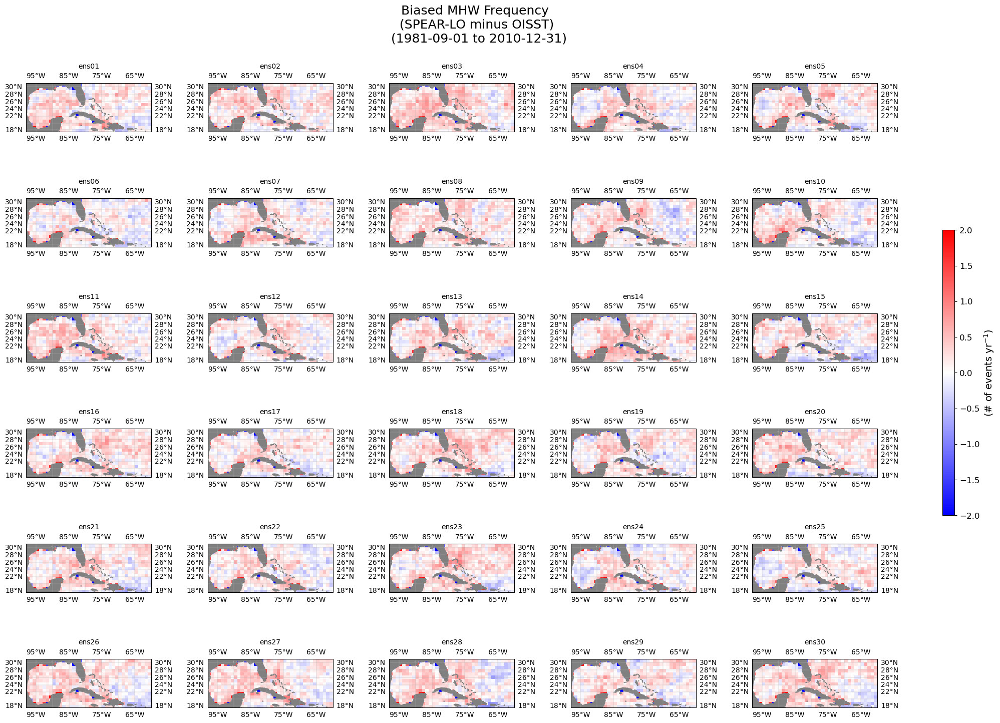

CPU times: user 26.2 s, sys: 1.64 s, total: 27.9 s
Wall time: 27.3 s


In [70]:
%%time
fig, ax = plt.subplots(6, 5, figsize=(20, 15), subplot_kw=dict(projection=ccrs.Mercator()))
ax_flat = ax.flatten()

norm = TwoSlopeNorm(vmin=-2, vcenter=0, vmax=2)

for i in range(30):
    ens_name = f"ens{i+1:02d}"
    title = f"{ens_name}"
    im = cartopy_plot(ev_freq_bias[i], cmap_choice='bwr', var_title=title, norm=norm, ax=ax_flat[i])

# ---- single shared colorbar ----
cbar_ax = fig.add_axes([0.965, 0.33, 0.012, 0.38]) # [left, bottom, width, height]
cbar = fig.colorbar(im, cax=cbar_ax)
cbar.set_label(r'(# of events yr$^{-1}$)', fontsize=14)
cbar.ax.tick_params(labelsize=12)

fig.suptitle("Biased MHW Frequency \n (SPEAR-LO minus OISST) \n (1981-09-01 to 2010-12-31)",
    fontsize=18, y=1.01)

# ---- spacing (Cartopy-safe) ----
fig.subplots_adjust(left=0.05, right=0.9, top=0.95, bottom=0.03, wspace=0.45, hspace=0.001)
plt.show()

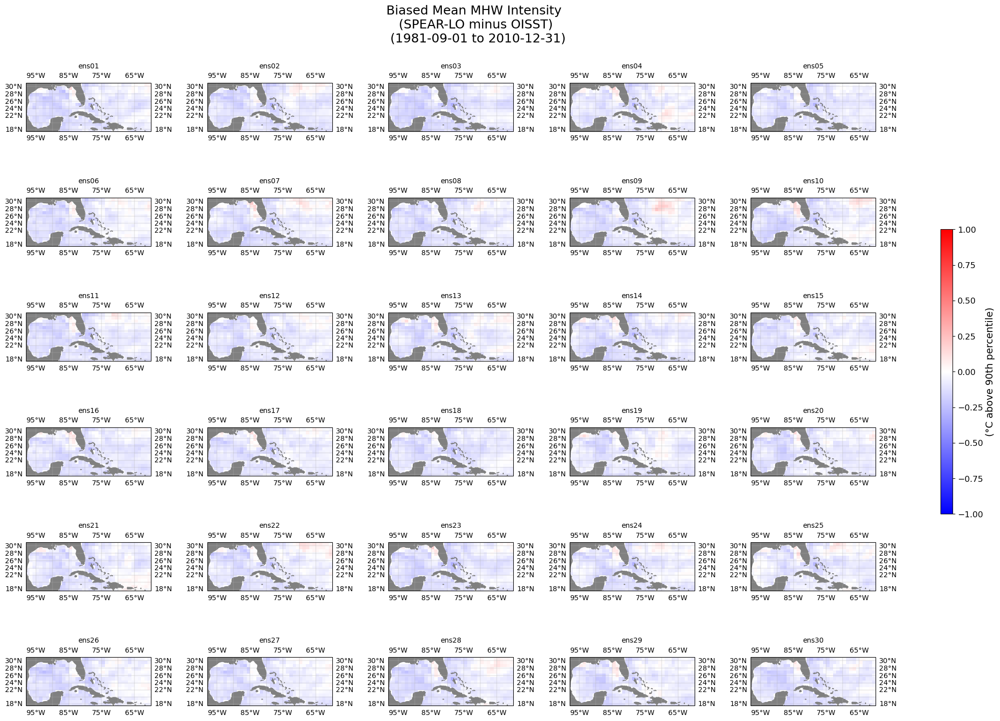

CPU times: user 27.3 s, sys: 33.7 s, total: 1min 1s
Wall time: 1min 13s


In [71]:
%%time
fig, ax = plt.subplots(6, 5, figsize=(20, 15), subplot_kw=dict(projection=ccrs.Mercator()))
ax_flat = ax.flatten()

norm = mcolors.Normalize(vmin=-1, vmax=1)

for i in range(30):
    ens_name = f"ens{i+1:02d}"
    title = f"{ens_name}"
    im = cartopy_plot(mhw_int_bias[i], cmap_choice='bwr', 
                      var_title=title, norm=norm, ax=ax_flat[i])

# ---- single shared colorbar ----
cbar_ax = fig.add_axes([0.965, 0.33, 0.012, 0.38]) # [left, bottom, width, height]
cbar = fig.colorbar(im, cax=cbar_ax)
cbar.set_label('(°C above 90th percentile)', fontsize=14)
cbar.ax.tick_params(labelsize=12)

fig.suptitle("Biased Mean MHW Intensity \n (SPEAR-LO minus OISST) \n (1981-09-01 to 2010-12-31)",
    fontsize=18, y=1.01)

# ---- spacing (Cartopy-safe) ----
fig.subplots_adjust(left=0.05, right=0.9, top=0.95, bottom=0.03, wspace=0.45, hspace=0.001)
plt.show()

## BIAS MAPS (Ensemble mean)

In [42]:
#Ensemble mean
stacked_ev_ct = xr.concat(event_counts_splo, dim="ensemble")
ev_ct_ens_mean = stacked_ev_ct.mean('ensemble')
ev_ct_bias_ens_mean = ev_ct_ens_mean - ev_ct_oi_ng.rename({'lat':'yT', 'lon':'xT'})

stacked_tot_mhw_days = xr.concat(total_mhw_days, dim="ensemble")
tot_mhw_days_ens_mean = stacked_tot_mhw_days.mean('ensemble')
tot_mhw_days_bias_ens_mean = tot_mhw_days_ens_mean - tot_mhw_days_oi_ng.rename({'lat':'yT', 'lon':'xT'})

mean_dur_bias_ens_mean = mean_duration.mean('ensemble') - mean_dur_oi_ng.rename({'lat':'yT', 'lon':'xT'}) 
med_dur_bias_ens_mean = mean_duration.mean('ensemble') - med_dur_oi_ng.rename({'lat':'yT', 'lon':'xT'})
max_dur_bias_ens_mean = mean_duration.mean('ensemble') - max_dur_oi_ng.rename({'lat':'yT', 'lon':'xT'})

stacked_mean_mhw_temp = xr.concat(mean_mhw_temp, dim="ensemble")
mhw_temp_ens_mean = stacked_mean_mhw_temp.mean('ensemble')
mean_mhw_tmp_bias_ens_mean = mhw_temp_ens_mean - mean_mhw_tmp_oi_ng.rename({'lat':'yT', 'lon':'xT'})

stacked_ev_freq = xr.concat(event_freq_splo, dim="ensemble")
ev_freq_ens_mean = stacked_ev_freq.mean('ensemble')
ev_freq_bias_ens_mean = ev_freq_ens_mean - ev_freq_oi_ng.rename({'lat':'yT', 'lon':'xT'})

stacked_mhw_int = xr.concat(mhw_intensity_splo, dim="ensemble")
mhw_int_ens_mean = stacked_mhw_int.mean('ensemble')
mhw_int_bias_ens_mean = mhw_int_ens_mean - mhw_int_oi_ng.rename({'lat':'yT', 'lon':'xT'})

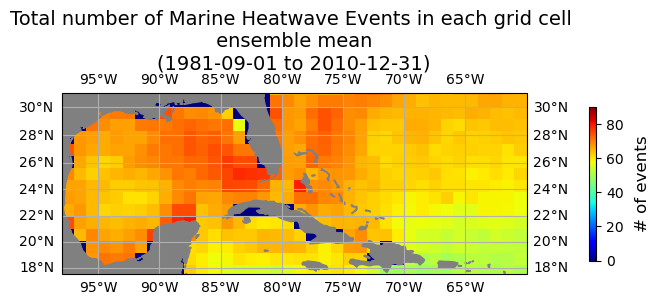

In [46]:
cartopy_plot_single(ev_ct_ens_mean, 'jet', '# of events', 
    'Total number of Marine Heatwave Events in each grid cell \n ensemble mean \n(1981-09-01 to 2010-12-31)',
                   vmin=0, vmax=90)

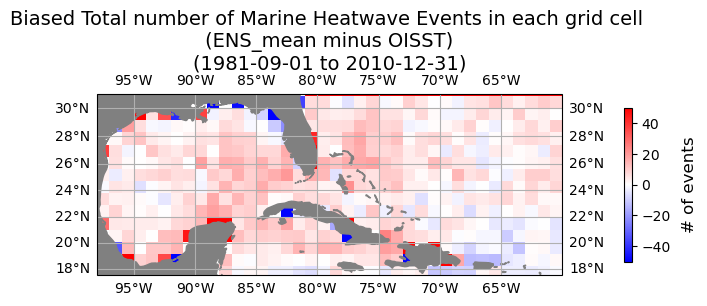

In [114]:
cartopy_plot_single(ev_ct_bias_ens_mean, 'bwr', '# of events', 
    'Biased Total number of Marine Heatwave Events in each grid cell \n (ENS_mean minus OISST) \n(1981-09-01 to 2010-12-31)',
                   norm=mcolors.TwoSlopeNorm(vmin=-50, vcenter=0, vmax=50))

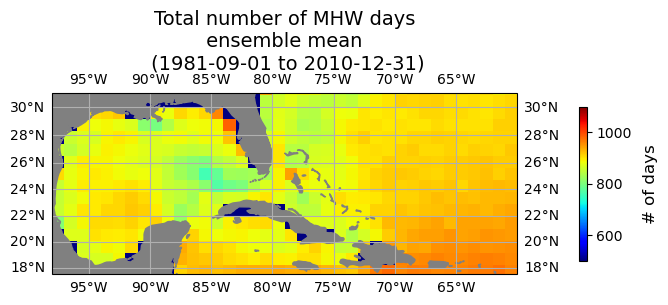

In [51]:
cartopy_plot_single(tot_mhw_days_ens_mean, 'jet', '# of days', 
'Total number of MHW days\n ensemble mean \n (1981-09-01 to 2010-12-31)',
                   vmin=500, vmax=1100)


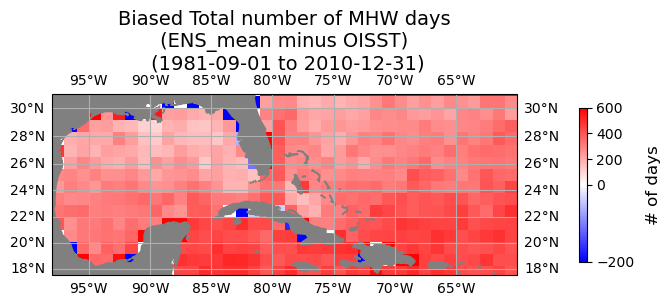

In [52]:
cartopy_plot_single(tot_mhw_days_bias_ens_mean, 'bwr', '# of days', 
'Biased Total number of MHW days\n (ENS_mean minus OISST) \n (1981-09-01 to 2010-12-31)',
                   norm=mcolors.TwoSlopeNorm(vmin=-200, vcenter=0, vmax=600));

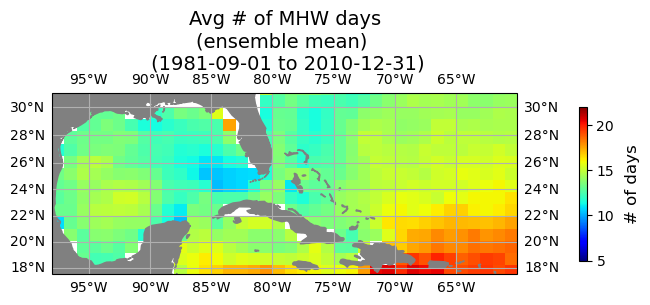

In [59]:
cartopy_plot_single(mean_duration.mean('ensemble'), 'jet', '# of days', 
    'Avg # of MHW days\n(ensemble mean) \n (1981-09-01 to 2010-12-31)',
                    vmin=5, vmax=22)


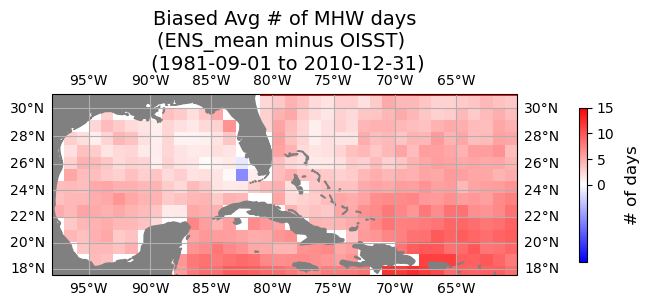

In [117]:
cartopy_plot_single(mean_dur_bias_ens_mean, 'bwr', '# of days', 
    'Biased Avg # of MHW days\n(ENS_mean minus OISST) \n (1981-09-01 to 2010-12-31)',
                    norm=mcolors.TwoSlopeNorm(vmin=-1, vcenter=0, vmax=15));


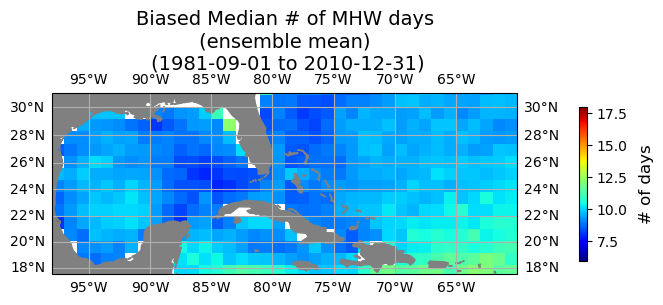

In [61]:
cartopy_plot_single(median_duration.mean('ensemble'), 'jet', '# of days', 
             'Biased Median # of MHW days\n (ensemble mean) \n (1981-09-01 to 2010-12-31)',
                    vmin=6, vmax=18);


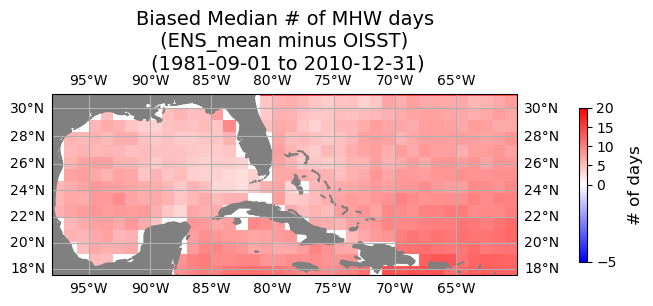

In [120]:
cartopy_plot_single(med_dur_bias_ens_mean, 'bwr', '# of days', 
             'Biased Median # of MHW days\n (ENS_mean minus OISST) \n (1981-09-01 to 2010-12-31)',
                    norm=mcolors.TwoSlopeNorm(vmin=-5, vcenter=0, vmax=20));


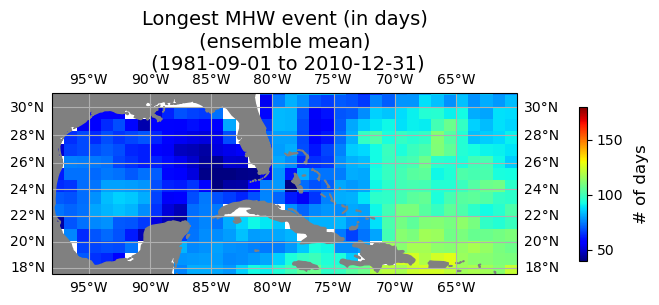

In [63]:
cartopy_plot_single(max_duration.mean('ensemble'), 'jet', '# of days', 
             'Longest MHW event (in days)\n (ensemble mean) \n (1981-09-01 to 2010-12-31)',
                    vmin=40, vmax=180);


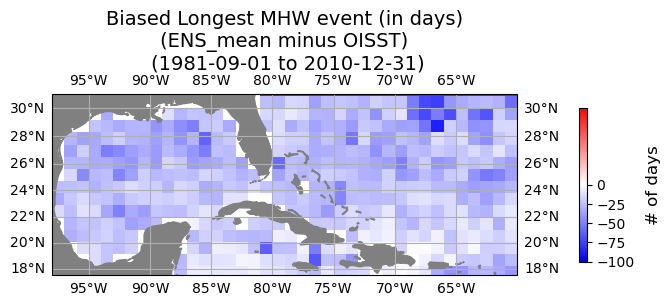

In [121]:
cartopy_plot_single(max_dur_bias_ens_mean, 'bwr', '# of days', 
             'Biased Longest MHW event (in days)\n (ENS_mean minus OISST) \n (1981-09-01 to 2010-12-31)',
                    norm=mcolors.TwoSlopeNorm(vmin=-100, vcenter=0, vmax=1));


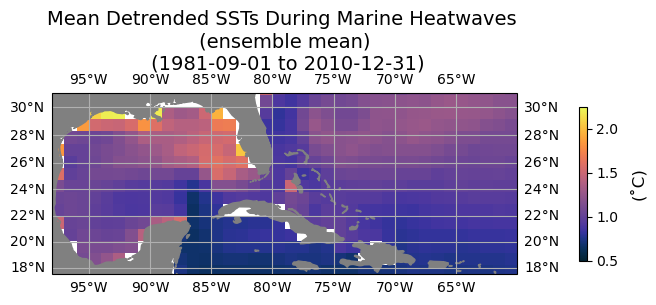

In [66]:
cartopy_plot_single(mhw_temp_ens_mean, cmocean.cm.thermal, '(˚C)', 
'Mean Detrended SSTs During Marine Heatwaves \n (ensemble mean) \n (1981-09-01 to 2010-12-31)',
                    vmin=0.5, vmax=2.25)

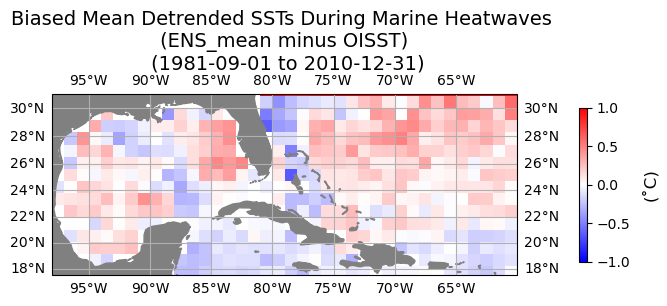

In [125]:
cartopy_plot_single(mean_mhw_tmp_bias_ens_mean, 'bwr', '(˚C)', 
'Biased Mean Detrended SSTs During Marine Heatwaves \n (ENS_mean minus OISST) \n (1981-09-01 to 2010-12-31)',
                    norm=mcolors.TwoSlopeNorm(vmin=-1, vcenter=0, vmax=1));

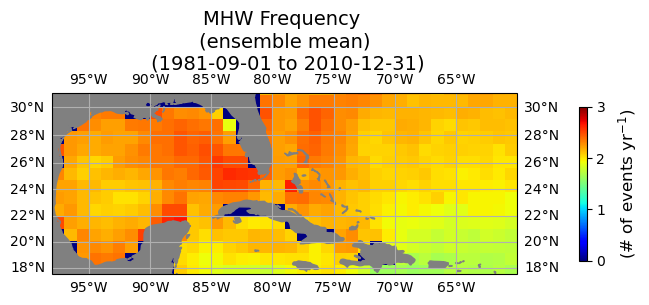

In [67]:
cartopy_plot_single(ev_freq_ens_mean, 'jet', r'(# of events yr$^{-1}$)', 
                    'MHW Frequency \n (ensemble mean) \n (1981-09-01 to 2010-12-31)',
                   vmin=0, vmax=3);

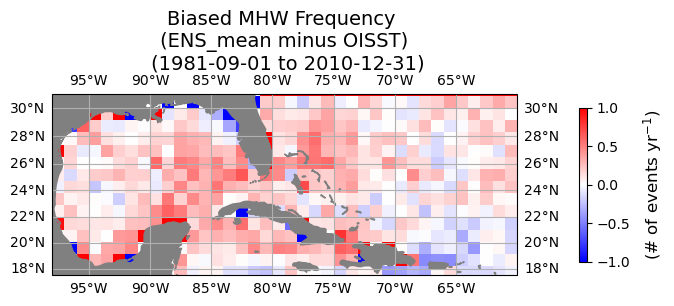

In [69]:
cartopy_plot_single(ev_freq_bias_ens_mean, 'bwr', r'(# of events yr$^{-1}$)', 
                    'Biased MHW Frequency \n (ENS_mean minus OISST) \n (1981-09-01 to 2010-12-31)',
                   norm=mcolors.TwoSlopeNorm(vmin=-1, vcenter=0, vmax=1));

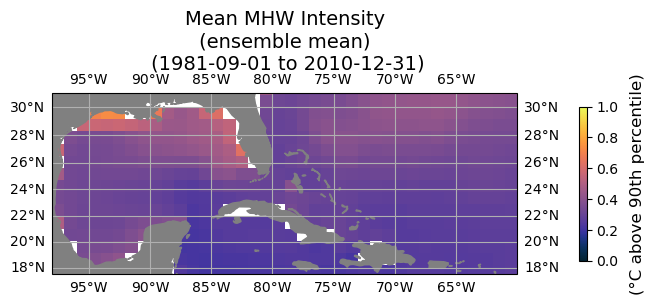

In [68]:
cartopy_plot_single(mhw_int_ens_mean, cmocean.cm.thermal, '(°C above 90th percentile)', 
             'Mean MHW Intensity\n (ensemble mean) \n (1981-09-01 to 2010-12-31)',
                    vmin=0, vmax=1);

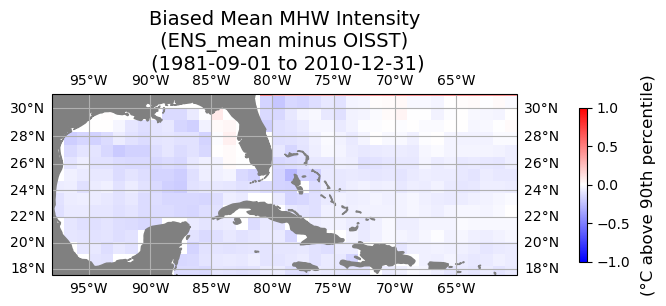

In [124]:
cartopy_plot_single(mhw_int_bias_ens_mean, 'bwr', '(°C above 90th percentile)', 
             'Biased Mean MHW Intensity\n (ENS_mean minus OISST) \n (1981-09-01 to 2010-12-31)',
                    norm=mcolors.TwoSlopeNorm(vmin=-1, vcenter=0, vmax=1));